In [1]:
# Analysis Tools
import numpy as np
import pandas as pd
import math
from scipy import stats
from scipy.stats import norm
# Plotting Tools
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px
import plotly.graph_objects as go
from plotly.subplots import make_subplots

# Extra Plotting Tools Required for Bar Chart Race
import matplotlib.ticker as ticker
import matplotlib.animation as animation
from IPython.display import HTML

In [2]:
# Plot Design Settings
sns.set_style("darkgrid", {"axes.facecolor": "#eff2f5", 'grid.color': '#c0ccd8', 'patch.edgecolor': '#B0B0B0', 'font.sans-serif': 'Verdana'})
sns.set_palette('Dark2_r')
plt.rc('font', size=19)
plt.rc('axes', titlesize=25)
plt.rc('axes', labelsize=20)
plt.rc('xtick', labelsize=17)
plt.rc('ytick', labelsize=17)
plt.rc('figure', titlesize=24)

In [3]:
# Other Tools
from sklearn.preprocessing import OneHotEncoder

# Mute warnings
import warnings
warnings.filterwarnings('ignore')

In [4]:
#import dataset
df=pd.read_csv('energy[1].csv')
df.shape

(55440, 11)

### Column descriptions: ###

Country - Country in question

Energy_type - Type of energy source

Year - Year the data was recorded

Energy_consumption - Amount of Consumption for the specific energy source, measured (quad Btu)

Energy_production - Amount of Production for the specific energy source, measured (quad Btu)

GDP - Countries GDP at purchasing power parities, measured (Billion 2015$ PPP)

Population - Population of specific Country, measured (Mperson)

Energy_intensity_per_capita - Energy intensity is a measure of the energy inefficiency of an economy. It is calculated as units of energy per unit of capita (capita = individual person), measured (MMBtu/person)

Energy_intensity_by_GDP- Energy intensity is a measure of the energy inefficiency of an economy. It is calculated as units of energy per unit of GDP, measred (1000 Btu/2015$ GDP PPP)

CO2_emission - The amount of C02 emitted, measured (MMtonnes CO2)

In [5]:
df.head()

,Unnamed: 0,Country,Energy_type,Year,Energy_consumption,Energy_production,GDP,Population,Energy_intensity_per_capita,Energy_intensity_by_GDP,CO2_emission
0,0,World,all_energy_types,1980,292.899790,296.337228,27770.910281,4.298127e+06,68.145921,10.547,4946.627130
1,1,World,coal,1980,78.656134,80.114194,27770.910281,4.298127e+06,68.145921,10.547,1409.790188
2,2,World,natural_gas,1980,53.865223,54.761046,27770.910281,4.298127e+06,68.145921,10.547,1081.593377
3,3,World,petroleum_n_other_liquids,1980,132.064019,133.111109,27770.910281,4.298127e+06,68.145921,10.547,2455.243565
4,4,World,nuclear,1980,7.575700,7.575700,27770.910281,4.298127e+06,68.145921,10.547,0.000000


In [6]:
# Removing extra index column
df = df.drop(['Unnamed: 0'], axis=1)


## Renaming columns for simplicity ##
Some column names are quite long, im just going to shorten them to abreviations

In [7]:
df.rename(columns={'Energy_type' : 'e_type', 'Energy_consumption' : 'e_con', 'Energy_production' : 'e_prod'
                   , 'Energy_intensity_per_capita' : 'ei_capita', 'Energy_intensity_by_GDP' : 'ei_gdp'}, inplace=True)

In [8]:
df.head()

,Country,e_type,Year,e_con,e_prod,GDP,Population,ei_capita,ei_gdp,CO2_emission
0,World,all_energy_types,1980,292.899790,296.337228,27770.910281,4.298127e+06,68.145921,10.547,4946.627130
1,World,coal,1980,78.656134,80.114194,27770.910281,4.298127e+06,68.145921,10.547,1409.790188
2,World,natural_gas,1980,53.865223,54.761046,27770.910281,4.298127e+06,68.145921,10.547,1081.593377
3,World,petroleum_n_other_liquids,1980,132.064019,133.111109,27770.910281,4.298127e+06,68.145921,10.547,2455.243565
4,World,nuclear,1980,7.575700,7.575700,27770.910281,4.298127e+06,68.145921,10.547,0.000000


Great, much less complicated to write now

## Renaming e_type value names ##
Some of the values for the e_type column are very long, im going to shorten them

In [9]:
df['e_type'] = df['e_type'].astype('category')

df['e_type'] = df['e_type'].cat.rename_categories({'all_energy_types': 'all', 'natural_gas': 'nat_gas','petroleum_n_other_liquids': 'pet/oth',
                                    'renewables_n_other': 'ren/oth'})

df['e_type'] = df['e_type'].astype('object')

In [10]:
df.head()

,Country,e_type,Year,e_con,e_prod,GDP,Population,ei_capita,ei_gdp,CO2_emission
0,World,all,1980,292.899790,296.337228,27770.910281,4.298127e+06,68.145921,10.547,4946.627130
1,World,coal,1980,78.656134,80.114194,27770.910281,4.298127e+06,68.145921,10.547,1409.790188
2,World,nat_gas,1980,53.865223,54.761046,27770.910281,4.298127e+06,68.145921,10.547,1081.593377
3,World,pet/oth,1980,132.064019,133.111109,27770.910281,4.298127e+06,68.145921,10.547,2455.243565
4,World,nuclear,1980,7.575700,7.575700,27770.910281,4.298127e+06,68.145921,10.547,0.000000


In [11]:
df.describe()

,Year,e_con,e_prod,GDP,Population,ei_capita,ei_gdp,CO2_emission
count,55440.0000,44287.000000,4.428900e+04,40026.000000,4.601400e+04,50358.000000,50358.000000,51614.000000
mean,1999.5000,1.537811,1.532700e+00,827.144126,6.263020e+04,71.898914,3.695104,78.800082
std,11.5435,15.456596,1.530356e+01,5981.703144,4.562088e+05,113.728738,4.590735,902.221463
min,1980.0000,-0.163438,-1.000000e-39,0.124958,1.147100e+01,0.000000,0.000000,-0.005130
25%,1989.7500,0.000000,0.000000e+00,9.737780,1.141950e+03,3.799939,0.899446,0.000000
50%,1999.5000,0.018381,5.121971e-04,47.757100,6.157680e+03,29.779260,2.987593,0.000000
75%,2009.2500,0.209422,1.125410e-01,263.687100,2.004290e+04,95.523627,4.969454,4.318822
max,2019.0000,601.040490,6.115090e+02,127690.247059,7.714631e+06,1139.320598,166.913605,35584.933498


## Data Types ##
Converting Year column to datetime dtype

In [12]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 55440 entries, 0 to 55439
Data columns (total 10 columns):
 #   Column        Non-Null Count  Dtype  
---  ------        --------------  -----  
 0   Country       55440 non-null  object 
 1   e_type        55440 non-null  object 
 2   Year          55440 non-null  int64  
 3   e_con         44287 non-null  float64
 4   e_prod        44289 non-null  float64
 5   GDP           40026 non-null  float64
 6   Population    46014 non-null  float64
 7   ei_capita     50358 non-null  float64
 8   ei_gdp        50358 non-null  float64
 9   CO2_emission  51614 non-null  float64
dtypes: float64(7), int64(1), object(2)
memory usage: 4.2+ MB


## Columns Stats ##

In [13]:
df.describe(include='all')

,Country,e_type,Year,e_con,e_prod,GDP,Population,ei_capita,ei_gdp,CO2_emission
count,55440,55440,55440.0000,44287.000000,4.428900e+04,40026.000000,4.601400e+04,50358.000000,50358.000000,51614.000000
unique,231,6,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
top,World,all,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
freq,240,9240,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
mean,NaN,NaN,1999.5000,1.537811,1.532700e+00,827.144126,6.263020e+04,71.898914,3.695104,78.800082
std,NaN,NaN,11.5435,15.456596,1.530356e+01,5981.703144,4.562088e+05,113.728738,4.590735,902.221463
min,NaN,NaN,1980.0000,-0.163438,-1.000000e-39,0.124958,1.147100e+01,0.000000,0.000000,-0.005130
25%,NaN,NaN,1989.7500,0.000000,0.000000e+00,9.737780,1.141950e+03,3.799939,0.899446,0.000000
50%,NaN,NaN,1999.5000,0.018381,5.121971e-04,47.757100,6.157680e+03,29.779260,2.987593,0.000000
75%,NaN,NaN,2009.2500,0.209422,1.125410e-01,263.687100,2.004290e+04,95.523627,4.969454,4.318822


## Features Unique Values ##

In [14]:
# Number of unique values in each variable
for var in df:
    print(f'{var}: {df[var].nunique()}')

Country: 231
e_type: 6
Year: 40
e_con: 30700
e_prod: 20729
GDP: 6653
Population: 7657
ei_capita: 7430
ei_gdp: 6486
CO2_emission: 17583


## Duplicates ##

In [15]:
print('Number of Duplicates: {}'.format(len(df[df.duplicated()])))

Number of Duplicates: 0


 ## Missing Values
 There is quite a bit of data thats missing in this dataset. For example, some of the missing data is because the given country no longer exists, leaving only NaN values before/after its creation/collapse, theres is also a lot of data missing not at random (MNAR), as well as data missing at random (MAR). I will be dealing with each of these appropriatlly in this section

In [16]:
for var in df:
    print(f'{var}: {df[var].isnull().sum()}')

Country: 0
e_type: 0
Year: 0
e_con: 11153
e_prod: 11151
GDP: 15414
Population: 9426
ei_capita: 5082
ei_gdp: 5082
CO2_emission: 3826


<Axes: >

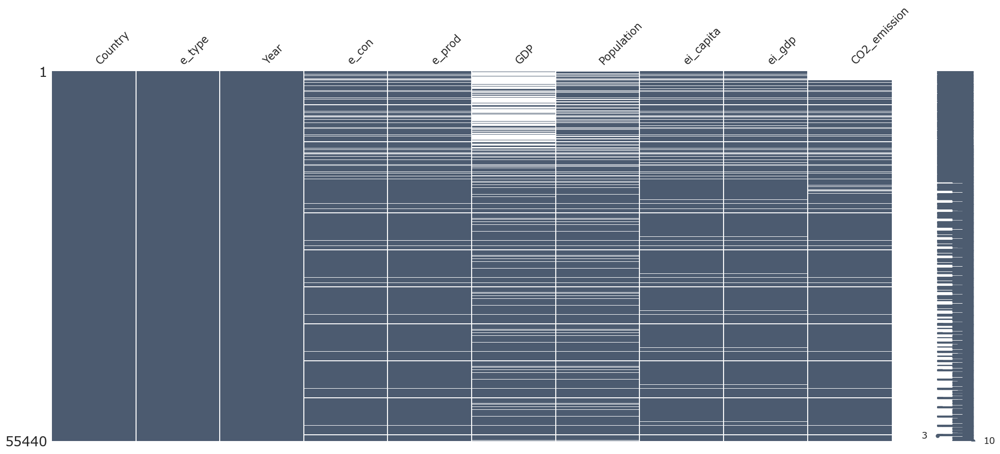

In [17]:
#Missing data as white lines 
import missingno as msno
msno.matrix(df,color=(0.3,0.36,0.44))

In [18]:
# Function ill be using to drop selected coutries
def to_drop(list):
    for country in list:
        value = df[df['Country']==country].index
        df.drop(labels=value, axis=0, inplace=True)

## Taking care of countries that no longer exist or formed within the time period
Quite a bit of the Countries/Territories in this dataset no longer exist or have become another country, leaving only NaN values for the years they didnt exist. Im going to drop all the rows of these years. Below are some examples of some of these countries.

In [19]:
df[df['Country']=='Former U.S.S.R.']

,Country,e_type,Year,e_con,e_prod,GDP,Population,ei_capita,ei_gdp,CO2_emission
426,Former U.S.S.R.,all,1980,51.569984,61.506642,NaN,NaN,0.0,0.0,NaN
427,Former U.S.S.R.,coal,1980,15.909849,17.152565,NaN,NaN,0.0,0.0,NaN
428,Former U.S.S.R.,nat_gas,1980,13.861120,15.984800,NaN,NaN,0.0,0.0,NaN
429,Former U.S.S.R.,pet/oth,1980,19.117843,25.624987,NaN,NaN,0.0,0.0,NaN
430,Former U.S.S.R.,nuclear,1980,0.832639,0.832639,NaN,NaN,0.0,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...
54481,Former U.S.S.R.,coal,2019,NaN,NaN,NaN,NaN,NaN,NaN,NaN
54482,Former U.S.S.R.,nat_gas,2019,NaN,NaN,NaN,NaN,NaN,NaN,NaN
54483,Former U.S.S.R.,pet/oth,2019,NaN,NaN,NaN,NaN,NaN,NaN,NaN
54484,Former U.S.S.R.,nuclear,2019,NaN,NaN,NaN,NaN,NaN,NaN,0.0


In [20]:
df[df['Country']=='South Sudan']

,Country,e_type,Year,e_con,e_prod,GDP,Population,ei_capita,ei_gdp,CO2_emission
1146,South Sudan,all,1980,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1147,South Sudan,coal,1980,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1148,South Sudan,nat_gas,1980,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1149,South Sudan,pet/oth,1980,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1150,South Sudan,nuclear,1980,NaN,NaN,NaN,NaN,NaN,NaN,0.000000
...,...,...,...,...,...,...,...,...,...,...
55201,South Sudan,coal,2019,0.000000,0.000000,17.3349,11062.1,2.404033,1.534111,0.000000
55202,South Sudan,nat_gas,2019,0.000000,0.000000,17.3349,11062.1,2.404033,1.534111,0.000000
55203,South Sudan,pet/oth,2019,0.026558,0.291543,17.3349,11062.1,2.404033,1.534111,1.675889
55204,South Sudan,nuclear,2019,NaN,NaN,17.3349,11062.1,2.404033,1.534111,0.000000


For all the years that each of the countries didnt exist, a set of NaN values remain for its columns. Luckily, theres a tool we can use to simply drop all rows with a certain amount of NaN values in them, which is dropna(). Im going to drop all the rows of the countries with more than 3 values set to NaN as this will take care of the years these countries didnt exist as well as rows that have to little information.

In [21]:
# Using a threshold of 7, which means all rows that have less than 7 non NaN values will be dropped
df.dropna(thresh=7, axis=0, inplace=True)

In [22]:
df[df['Country']=='Former U.S.S.R.']

,Country,e_type,Year,e_con,e_prod,GDP,Population,ei_capita,ei_gdp,CO2_emission
426,Former U.S.S.R.,all,1980,51.569984,61.506642,NaN,NaN,0.0,0.0,NaN
427,Former U.S.S.R.,coal,1980,15.909849,17.152565,NaN,NaN,0.0,0.0,NaN
428,Former U.S.S.R.,nat_gas,1980,13.861120,15.984800,NaN,NaN,0.0,0.0,NaN
429,Former U.S.S.R.,pet/oth,1980,19.117843,25.624987,NaN,NaN,0.0,0.0,NaN
430,Former U.S.S.R.,nuclear,1980,0.832639,0.832639,NaN,NaN,0.0,0.0,0.000000
...,...,...,...,...,...,...,...,...,...,...
15673,Former U.S.S.R.,coal,1991,14.561299,15.248816,NaN,NaN,0.0,0.0,1443.073463
15674,Former U.S.S.R.,nat_gas,1991,25.314168,28.966476,NaN,NaN,0.0,0.0,1358.780491
15675,Former U.S.S.R.,pet/oth,1991,17.388062,22.081015,NaN,NaN,0.0,0.0,1222.000000
15676,Former U.S.S.R.,nuclear,1991,2.310946,2.310946,NaN,NaN,0.0,0.0,0.000000


Perfect, all the countries that were newly created or had fallen in the timezone of the dataset are all taken care of
## C02_emission column

In [23]:
# Number of values for each year
temp_co2 = df[df['Year']<=1985]
temp_co2.groupby('Year')['CO2_emission'].count()

Year
1980     378
1981    1155
1982    1156
1983    1156
1984    1155
1985    1155
Name: CO2_emission, dtype: int64

The year 1980 has only a few C02_emission values, im just going to remove this year for simplicity

In [25]:
df = df[df['Year']>1980]

Also removing all values that have C02_emission as NaN, as these values will be useless in this analysis

In [26]:
df.dropna(subset=['CO2_emission'], inplace=True)

## e_con and e_prod columns
A lot of values from e_con and e_prod are missing due to the fact that most countries dont consume or produce Nuclear energy, so they leave them as Nan. Im going to add 0 in place of these

In [27]:
# Splitting e_type nuclear from rest of dataset
nuclear = df[df['e_type']=='nuclear']
    
# Keeping the remaining of the main dataset
temp_ecp = df[df['e_type']!='nuclear']

# Replacing all Nan values of e_con and e_prod of e_type nuclear to 0
nuclear[['e_con', 'e_prod']] = nuclear[['e_con', 'e_prod']].replace(np.nan, 0)

# Joining them back up
df = pd.concat([nuclear, temp_ecp]).sort_index()

## GDP column
Keep in mind that each country has 234 values within the dataset, one for each of the 6 energy types, each year. So any countries with more than 100 missing GDP values will be problametic. I will be dropping all these countries for this reason.

In [28]:
temp_gdp = pd.DataFrame(df['GDP'].isnull().groupby(df['Country']).sum()).reset_index()
# Countries with more than 90 missing GDP values
temp_gdp = temp_gdp[temp_gdp['GDP']>=90]

temp_gdp

,Country,GDP
3,American Samoa,132
5,Antarctica,195
45,Cook Islands,195
64,Falkland Islands,195
65,Faroe Islands,182
73,French Guiana,195
74,French Polynesia,195
82,Gibraltar,195
87,Guam,132
133,Micronesia,159


In [29]:
# Making List of all these countries
m_gdp = [country for country in temp_gdp['Country']]

# Dropping all the countries on the list from the main dataset (Function used is the one above)
to_drop(m_gdp)

Looking further into the the values of GDP from the years 1980 to 1987

In [30]:
temp_gdp = df[df['Year']<=1990]
temp_gdp.groupby('Year')['e_con', 'e_prod', 'GDP', 'Population', 'ei_capita', 'ei_gdp', 'CO2_emission'].count()

,e_con,e_prod,GDP,Population,ei_capita,ei_gdp,CO2_emission
Year,,,,,,,
1981,1049,1049,310,994,1025,1025,1049
1982,1049,1049,310,994,1025,1025,1049
1983,1049,1049,310,994,1025,1025,1049
1984,1048,1048,310,982,1024,1024,1048
1985,1048,1048,310,982,1024,1024,1048
1986,1050,1050,310,984,1026,1026,1050
1987,1049,1049,310,988,1025,1025,1049
1988,1053,1053,972,1012,1029,1029,1053
1989,1054,1054,978,1018,1030,1030,1054


Youll notice in the GDP column from 1980 to 1987 not many countries gave this information, which means theres a lot of NaN values

In [31]:
# Looking further into the GDP data before 1988
temp_gdp = df[df['Year']<=1987]
temp_gdp = pd.DataFrame(temp_gdp['GDP'].isnull().groupby(temp_gdp['Country']).sum()).reset_index()

# Countries with more than 30 missing GDP values
temp_gdp = temp_gdp[temp_gdp['GDP']>30]
temp_gdp.head(200)

,Country,GDP
0,Afghanistan,42
1,Albania,42
2,Algeria,42
3,Angola,42
4,Antigua and Barbuda,35
...,...,...
171,Vanuatu,42
173,Vietnam,42
175,Yemen,42
176,Zambia,42


Having 42 missing GDP values like the countries above means that all GDP values from the time period of 1980-1987 are NaN. This implys close to half the countries in this dataset have no GDP data in this timeperiod! This is not good of course as this is an important column for this analysis, so Ill be removing everything up to 1988.

In [32]:
#Removing everything up to 1988
df = df[df['Year']>=1988]

## Population column

In [33]:
temp_pop = pd.DataFrame(df['Population'].isnull().groupby(df['Country']).sum()).reset_index()
# Countries with more than 100 missing Population values
temp_pop = temp_pop[temp_pop['Population']>=100]

temp_pop

,Country,Population


Dont seem to be any Population values over 100 in the dataset anymore, I assume I already dealt with them when I removed all the countries with a high missing value counts for the GDP values.

The only countries with missing population data seem to be former countries, including the USSR, West and East Germany, Former Yugoslavia etc, mostly former easter block countries. Im going to drop all these countries for simplicity.

In [34]:
temp_pop = pd.DataFrame(df[df['Population'].isnull()])
cont = temp_pop['Country'].unique()

print(cont)

to_drop(cont)

['Former Czechoslovakia' 'Former U.S.S.R.' 'Former Yugoslavia'
 'Germany, East' 'Germany, West' 'Hungary' 'Poland'
 'Former Serbia and Montenegro']


## ei_capita and ei_gdp columns

In [35]:
# ei_capita
temp_ei_capita = pd.DataFrame(df['ei_capita'].isnull().groupby(df['Country']).sum()).reset_index()
# Countries with missing ei_capita values
temp_ei_capita = temp_ei_capita[temp_ei_capita['ei_capita']>0]


# ei_gdp
temp_ei_gdp = pd.DataFrame(df['ei_gdp'].isnull().groupby(df['Country']).sum()).reset_index()
# Countries with missing ei_gdp values
temp_ei_gdp = temp_ei_gdp[temp_ei_gdp['ei_gdp']>0]


print(temp_ei_capita, '\n')
print(temp_ei_gdp)

                  Country  ei_capita
70              Greenland        155
80                Iceland        160
124  Netherlands Antilles        160
181   Trinidad and Tobago        160
185   U.S. Virgin Islands        160 

                  Country  ei_gdp
70              Greenland     155
80                Iceland     160
124  Netherlands Antilles     160
181   Trinidad and Tobago     160
185   U.S. Virgin Islands     160


Its the same countries that are missing these values, and they all have a relatively small population of around 1 million or less as well, so for simplicity im going to remove them as they probably wont be of much importance compared to the rest of the countries

In [36]:
# Making List of all these countries
m_ei_capita = [country for country in temp_ei_capita['Country']]
m_ei_gdp = [country for country in temp_ei_gdp['Country']]

# Dropping all the countries on the list from the main dataset
to_drop(m_ei_capita)
to_drop(m_ei_gdp)

In [37]:
for var in df:
    print(f'{var}: {df[var].isnull().sum()}')

Country: 0
e_type: 0
Year: 0
e_con: 0
e_prod: 0
GDP: 189
Population: 0
ei_capita: 0
ei_gdp: 0
CO2_emission: 0


Perfect, a lot of the missing data has been taken care of, most of it being the data not missing at random (MNAR), I can now just use KNN imputation to take care of the rest.

In [38]:
from sklearn.impute import KNNImputer

# One hot encoding the categorical variables for now
cat_vars = df[['Country', 'e_type', 'Year']]
cat_dummies = pd.get_dummies(cat_vars, drop_first=True)


# Creating Temporary dataset
temp_m = df.drop(['Country', 'e_type', 'Year'], axis=1)
temp_m = pd.concat([cat_dummies, temp_m], axis=1)

# KNN Imputer
imputer = KNNImputer(
    n_neighbors=5, # the number of neighbours K
    weights='distance', # the weighting factor
    metric='nan_euclidean', # the metric to find the neighbours
    add_indicator=False, # whether to add a missing indicator
)

# Attaching the Imputer to dataset
temp_m = imputer.fit_transform(temp_m)
temp_m = pd.DataFrame(temp_m)

temp_m.head()


,0,1,2,3,4,5,6,7,8,9,...,197,198,199,200,201,202,203,204,205,206
0,1988.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,345.560876,347.412863,42106.595403,4.927545e+06,70.128405,8.206811,21163.840556
1,1988.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,96.873178,98.484482,42106.595403,4.927545e+06,70.128405,8.206811,8930.924825
2,1988.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,71.010048,71.852938,42106.595403,4.927545e+06,70.128405,8.206811,3571.676242
3,1988.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,1.0,0.0,133.445814,132.485303,42106.595403,4.927545e+06,70.128405,8.206811,8661.239490
4,1988.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,1.0,0.0,0.0,19.226897,19.226897,42106.595403,4.927545e+06,70.128405,8.206811,0.000000


Now i just need to join these new values back into the original dataset

In [39]:
df.head(10)

,Country,e_type,Year,e_con,e_prod,GDP,Population,ei_capita,ei_gdp,CO2_emission
11088,World,all,1988,345.560876,347.412863,42106.595403,4.927545e+06,70.128405,8.206811,21163.840556
11089,World,coal,1988,96.873178,98.484482,42106.595403,4.927545e+06,70.128405,8.206811,8930.924825
11090,World,nat_gas,1988,71.010048,71.852938,42106.595403,4.927545e+06,70.128405,8.206811,3571.676242
11091,World,pet/oth,1988,133.445814,132.485303,42106.595403,4.927545e+06,70.128405,8.206811,8661.239490
11092,World,nuclear,1988,19.226897,19.226897,42106.595403,4.927545e+06,70.128405,8.206811,0.000000
11093,World,ren/oth,1988,24.927484,25.363243,42106.595403,4.927545e+06,70.128405,8.206811,0.000000
11094,Afghanistan,all,1988,0.111221,0.121394,37.701300,1.161800e+04,9.573144,2.950052,3.646724
11095,Afghanistan,coal,1988,0.002875,0.002731,37.701300,1.161800e+04,9.573144,2.950052,0.324617
11096,Afghanistan,nat_gas,1988,0.073290,0.110982,37.701300,1.161800e+04,9.573144,2.950052,1.222107
11097,Afghanistan,pet/oth,1988,0.027375,0.000000,37.701300,1.161800e+04,9.573144,2.950052,2.100000


In [40]:
for var in df:
    print(f'{var}: {df[var].isnull().sum()}')

Country: 0
e_type: 0
Year: 0
e_con: 0
e_prod: 0
GDP: 189
Population: 0
ei_capita: 0
ei_gdp: 0
CO2_emission: 0


<Axes: >

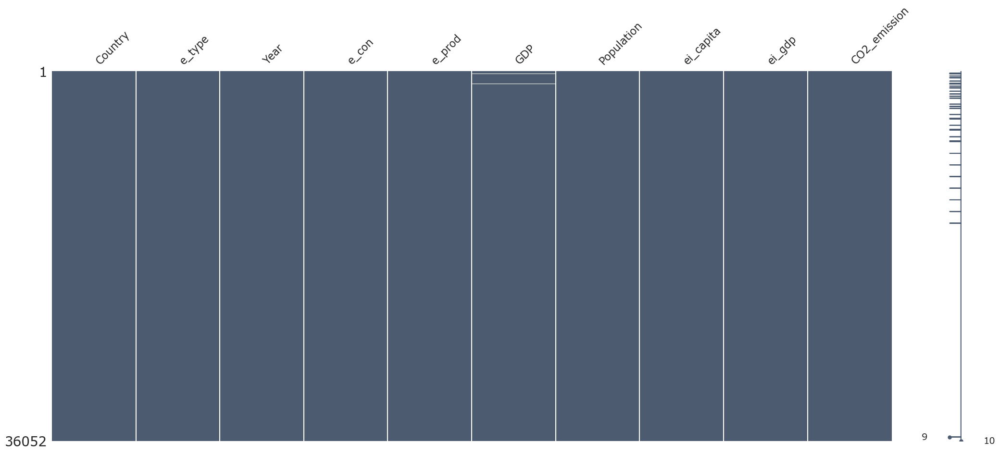

In [41]:
msno.matrix(df,color=(0.3,0.36,0.44))

## Rounding Float Values

In [42]:
for var in df:
    if df[var].dtype == 'float':
        df[var] = df[var].round(2)

## Final Look at the Dataset

In [43]:
df.head()

,Country,e_type,Year,e_con,e_prod,GDP,Population,ei_capita,ei_gdp,CO2_emission
11088,World,all,1988,345.56,347.41,42106.6,4927545.08,70.13,8.21,21163.84
11089,World,coal,1988,96.87,98.48,42106.6,4927545.08,70.13,8.21,8930.92
11090,World,nat_gas,1988,71.01,71.85,42106.6,4927545.08,70.13,8.21,3571.68
11091,World,pet/oth,1988,133.45,132.49,42106.6,4927545.08,70.13,8.21,8661.24
11092,World,nuclear,1988,19.23,19.23,42106.6,4927545.08,70.13,8.21,0.00


In [44]:
df.shape

(36052, 10)

Weve gotten rid of 19,388 rows of data

## Deeper look into the data were working with

## Target Distribution

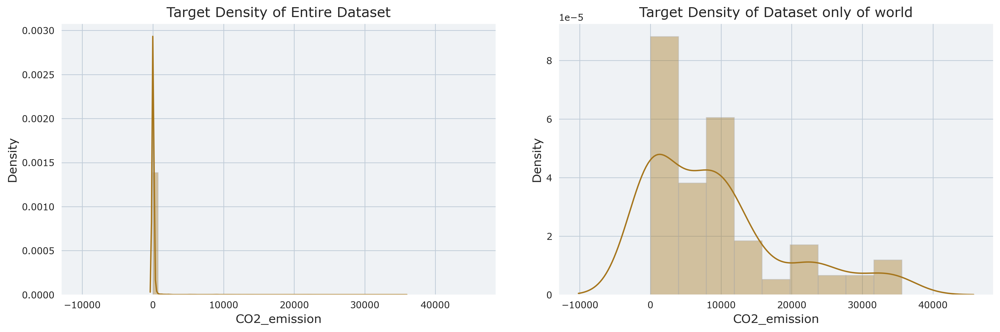

In [45]:
with plt.rc_context(rc = {'figure.dpi': 250, 'axes.labelsize': 13,
                          'xtick.labelsize': 10, 'ytick.labelsize': 10,
                          'legend.title_fontsize': 7, 'axes.titlesize': 15,
                          'axes.titlepad': 7}):


    fig, ax = plt.subplots(1, 2, sharex=True, figsize=(15,5))
    
    # Entire dataset
    sns.distplot(df['CO2_emission'], ax=ax[0]).set_title('Target Density of Entire Dataset')
    
    # Dataset only of world
    world = df[df['Country']=='World']
    sns.distplot(world['CO2_emission'], ax=ax[1]).set_title('Target Density of Dataset only of world')
    

    plt.tight_layout(pad=0.4, w_pad=2, h_pad=2)
    plt.show()

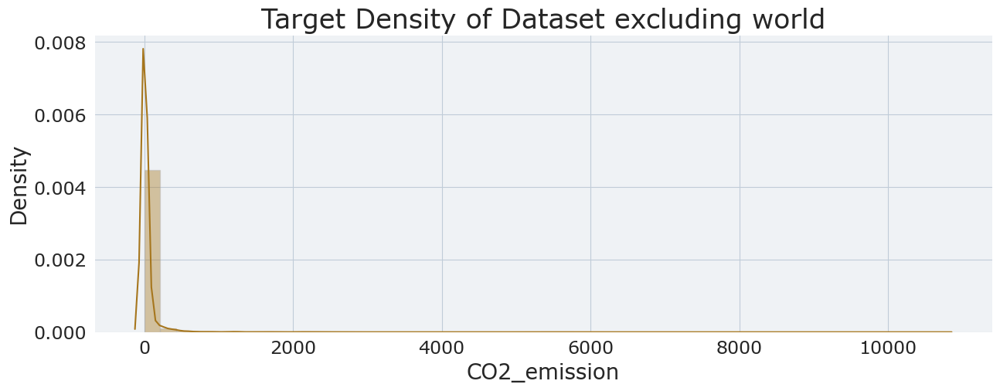

In [46]:
not_world = df[df['Country']!='World']

plt.figure(figsize=(15, 5))
sns.distplot(not_world['CO2_emission']).set_title('Target Density of Dataset excluding world')
plt.show()

## Distribution of energy types

In [47]:
temp_dist = df.groupby('e_type').count()['CO2_emission'].reset_index().sort_values(by='CO2_emission',ascending=False)
temp_dist.style.background_gradient(cmap='winter')

,e_type,CO2_emission
3,nuclear,6039
5,ren/oth,6039
0,all,6009
1,coal,6009
2,nat_gas,5979
4,pet/oth,5977


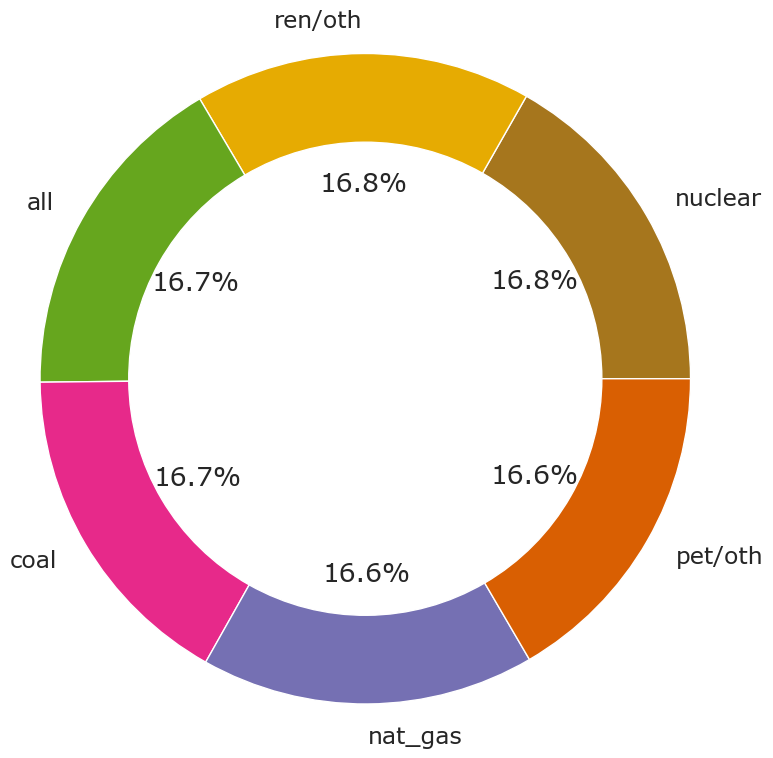

In [48]:
percent = temp_dist['CO2_emission']
labels= temp_dist['e_type']

my_pie,_,_ = plt.pie(percent, radius = 2.2, labels=labels, autopct="%.1f%%")
plt.setp(my_pie, width=0.6, edgecolor='white') 
plt.show()

All energy types pretty much equally distributed

## Correlations

In [49]:
df.corr()

,Year,e_con,e_prod,GDP,Population,ei_capita,ei_gdp,CO2_emission
Year,1.000000,0.017138,0.017131,0.037829,0.012353,0.042665,-0.083087,0.016010
e_con,0.017138,1.000000,0.993353,0.712189,0.698042,0.034545,0.039434,0.985197
e_prod,0.017131,0.993353,1.000000,0.708141,0.697766,0.040334,0.043974,0.977734
GDP,0.037829,0.712189,0.708141,1.000000,0.957655,0.037593,0.033350,0.679897
Population,0.012353,0.698042,0.697766,0.957655,1.000000,-0.014636,0.038882,0.670504
ei_capita,0.042665,0.034545,0.040334,0.037593,-0.014636,1.000000,0.340483,0.029209
ei_gdp,-0.083087,0.039434,0.043974,0.033350,0.038882,0.340483,1.000000,0.039335
CO2_emission,0.016010,0.985197,0.977734,0.679897,0.670504,0.029209,0.039335,1.000000


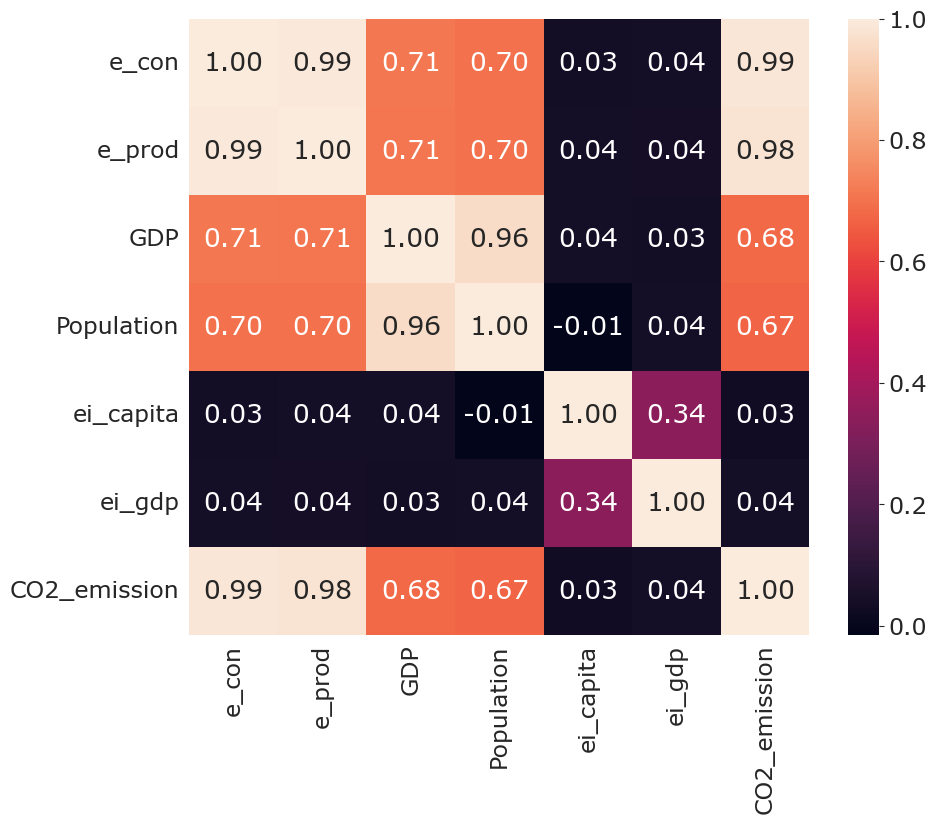

In [50]:
plt.figure(figsize=(10,8))
sns.heatmap(data=df.iloc[:,3:].corr(), annot=True, fmt='.2f')
plt.show()

 ## Pair Plot

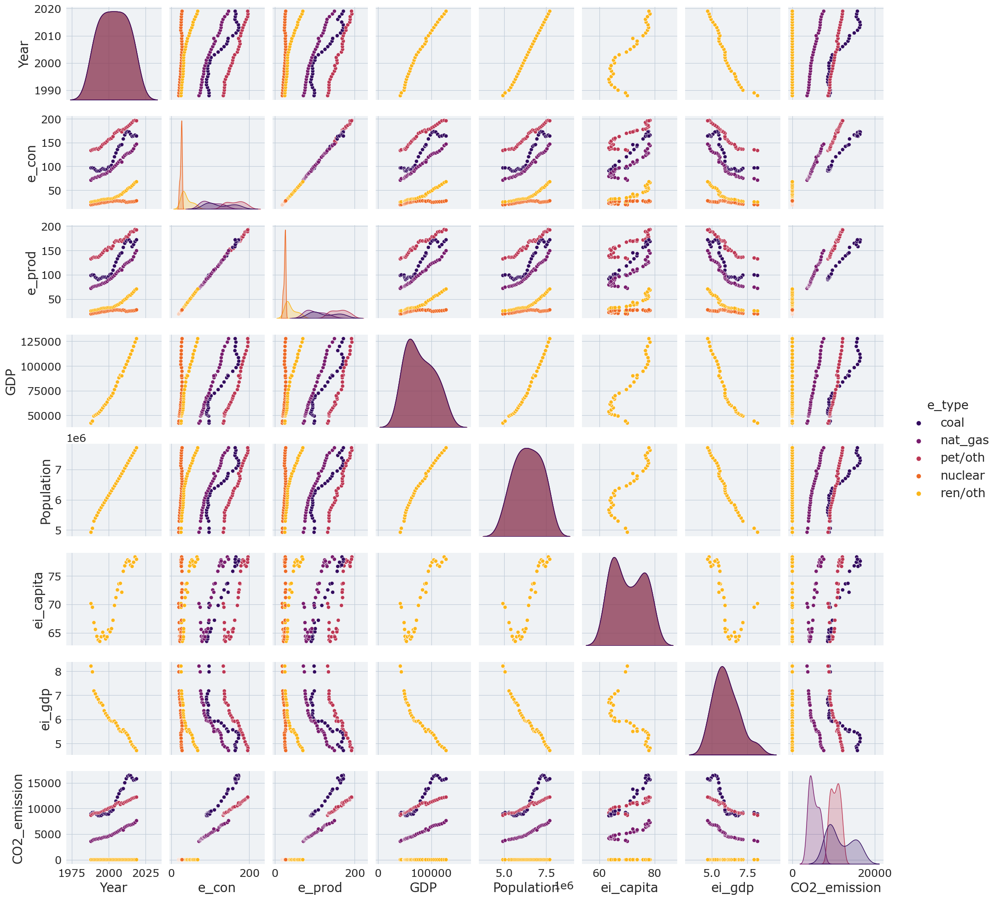

In [51]:
temp_pp = df[df['Country']=='World'][df['e_type']!='all']

sns.pairplot(temp_pp, hue='e_type',palette="inferno")
plt.show()

### Project Topic:-how to reduce CO2 emission without curbing economic growth

# Analysis

overview of Energy Consumption Globally

Energy Consumption refers to ALL the energy used in day to day life. There are many factors at play when it comes to measuring the energy consumption of a country, mainly the consumption difference between a countries industries and its population.

The energy consumption of a population is often measured using Energy intensity per capita, which we looked at a few sections above. In that section we saw that more developed countries tend to have a worse Energy-intensity per Capita, as there population is able to spend more on amenities like technology, appliances, and transportation. We also saw that the countries with the smallest energy intensity per capita were all developing countries, there populations arent able to afford many of the amenities available to more developed nations.

The energy consumption of industries is often measured using Energy intensity of GDP, which we also saw a few sections above. In that section we saw that more developed countries tend to have a smaller energy intensity of GDP, while devolping countries tend to have a larger energy intensity of GDP. The main reason for this is that more developed countries can afford less energy intensive technologies and ways of production, unlike developing countries which cant, therfore leaving them stuck with more energy intensive means of production.

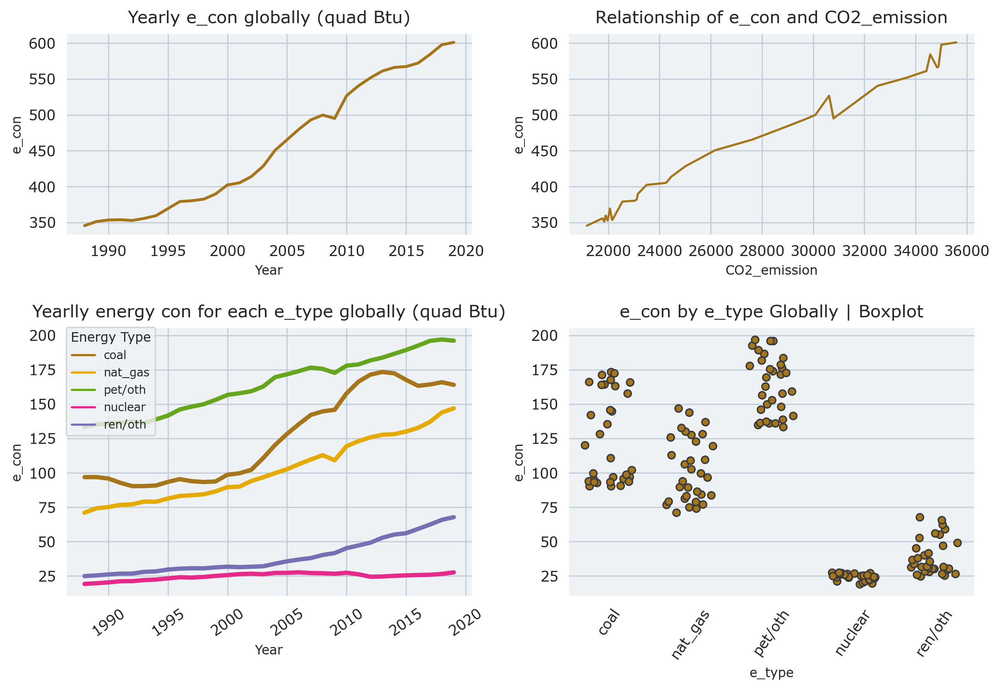

In [52]:
with plt.rc_context(rc = {'figure.dpi': 250, 'axes.labelsize': 9,
                          'xtick.labelsize': 10, 'ytick.labelsize': 10,
                          'legend.title_fontsize': 7, 'axes.titlesize': 12,
                          'axes.titlepad': 7}):

    # Specifying all countries == world
    con = df[df['Country']=='World']
    
    
    fig_4, ax_4 = plt.subplots(2, 2, figsize = (10, 7), # constrained_layout = True,
                               gridspec_kw = {'width_ratios': [3, 3], 
                                                'height_ratios': [3, 4]})

    ax_flat = ax_4.flatten()

    
    ### 1st graph
    sns.lineplot(ax=ax_flat[0], data=con[con['e_type']=='all'],
             x='Year', y='e_con', lw=2
            ).set_title('Yearly e_con globally (quad Btu)')

    
    ### 2nd graph
    sns.lineplot(ax=ax_flat[1], data=con[con['e_type']=='all'],
                x='CO2_emission', y='e_con'
               ).set_title('Relationship of e_con and CO2_emission')
    

    ### 3rd graph

    sns.lineplot(ax=ax_flat[2], data=con[con['e_type']!='all'],
            x='Year',
            y='e_con',
            hue='e_type',
            lw=3,
            ).set_title('Yearlly energy con for each e_type globally (quad Btu)')
    
    
    ax_flat[2].legend(fontsize=8, title='Energy Type', title_fontsize=9, loc='upper left', borderaxespad=0)
    ax_flat[2].tick_params(axis='x', rotation=35)

    
    
    
    ### 4th graph
    sns.stripplot(ax=ax_flat[3], data=con[con['e_type']!='all'],
                x='e_type', y='e_con', jitter=.3, linewidth=1
               ).set_title('e_con by e_type Globally | Boxplot')

    ax_flat[3].tick_params(axis='x', rotation=55)
    
    plt.tight_layout(pad = 1)
    plt.show()

## Percentage rate increase/decrease

In [53]:
# Specifying all countries == world, and e_type == all
con0 = df[df['Country']=='World'][df['e_type']=='all'][['Year', 'e_con']].reset_index(drop=True)

years = con0['Year'].unique()

# For yearlly percentage change
temp_con0 = con0
temp_con0['pct_change'] = temp_con0['e_con'].pct_change() * 100

# For overall percentage change
start = con0.loc[con0['Year']==1988] 
end = con0.loc[con0['Year']==2019]
temp_con02 = pd.concat([start, end]).reset_index(drop=True)
    
temp_con02['pct_change'] = temp_con02['e_con'].pct_change() * 100

# Plotting figure
fig = px.area(temp_con0, x='Year', y='pct_change', title='Yearlly percent change of energy consumption')
fig.show()

print(f'The average yearly percentage change is {round(temp_con0["pct_change"].mean(), 2)}%,\n and the overall percentage change from 1988 to 2019 is {round(temp_con02["pct_change"].sum(), 2)}%')

The average yearly percentage change is 1.81%,
 and the overall percentage change from 1988 to 2019 is 73.93%


Global energy consumption has been on average increasing by 1.81% a year, and overall from 1988 to 2019 has increased by 73.93%. Another thing to mention is that the only sharp decrease in energy consumption was in 2009, a year after the financial crisis.

In [54]:
# Specifying all countries == world, and e_type == all
con0 = df[df['Country']=='World'][df['e_type']!='all'][['Year','Country', 'e_type', 'e_con']].reset_index(drop=True)

# coal
coal = con0
coal['pct_change'] = con0[con0['e_type']=='coal']['e_con'].pct_change() * 100
coal = coal[coal['pct_change'].notna()]

# nat_gas
nat_gas = con0
nat_gas['pct_change'] = con0[con0['e_type']=='nat_gas']['e_con'].pct_change() * 100
nat_gas = nat_gas[nat_gas['pct_change'].notna()]

# pet/oth
pet_oth = con0
pet_oth['pct_change'] = con0[con0['e_type']=='pet/oth']['e_con'].pct_change() * 100
pet_oth = pet_oth[pet_oth['pct_change'].notna()]

# nuclear
nuclear = con0
nuclear['pct_change'] = con0[con0['e_type']=='nuclear']['e_con'].pct_change() * 100
nuclear = nuclear[nuclear['pct_change'].notna()]

# ren/oth
ren_oth = con0
ren_oth['pct_change'] = con0[con0['e_type']=='ren/oth']['e_con'].pct_change() * 100
ren_oth = ren_oth[ren_oth['pct_change'].notna()]

# Rejoining all the datasets back together
final_df = pd.concat([coal, nat_gas, pet_oth, nuclear, ren_oth], axis=0)

fig = px.area(final_df, x='Year', y='pct_change', facet_col='e_type', color='e_type', facet_col_wrap=2, 
             title='Yearlly percentage rate increase/decrease of the consumption of each energy type')
fig.show()

## Top Consumers

In [55]:
# Specifying all countreis != world, as well as all energy types
con1 = df[df['Country']!='World'][df['e_type']=='all']

list_con = []

# Sum of all yearly conumption for all energy types
for country in con1['Country'].unique():
    total_con = con1[con1['Country']==country]['e_con'].sum(axis=0)
    list_con.extend([[country, total_con]])

# Temporary dataset of all the Countries and there respective total Consumption over the time period
top_con = pd.DataFrame(list_con, columns=['Country', 'Total_con']).sort_values(by='Total_con',ascending=False)

# Plotting the top 20 Consumers
fig = px.bar(top_con.head(20), x='Country', y='Total_con', title='Top 20 Energy Consumers over the time period (quad Btu)')
fig.show()

<Axes: xlabel='Year', ylabel='e_con'>

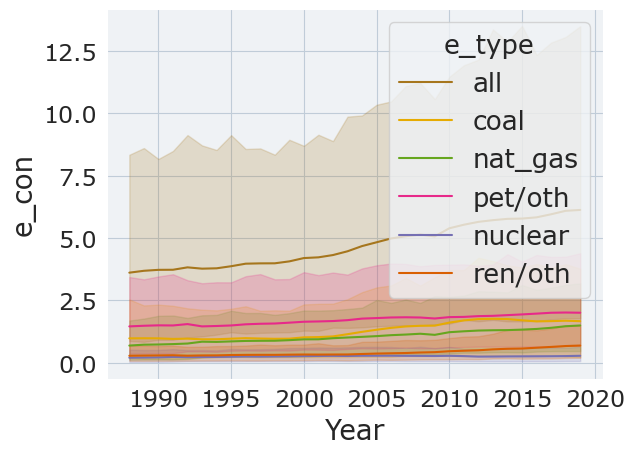

In [56]:
sns.lineplot(data=df, x='Year', y='e_con', hue='e_type')

## Choropleth

In [57]:
con2 = df[df['Country']!='World'][df['e_type']=='all']

temp_con2 = con2[['Country', 'Year', 'e_con']].groupby(['Country','Year']).sum().reset_index()

px.choropleth(data_frame=temp_con2, locations="Country", locationmode='country names', animation_frame="Year",
              color='e_con', title="Energy Consumption of each country from 1988 to 2019 (quad Btu)")

Its quite obvious to tell that China and The United States are the largest energy consumers worldwide throughout this time period, this makes sense as they are the two largest economies in the world.

## What energy types do the top 4 consumers use?



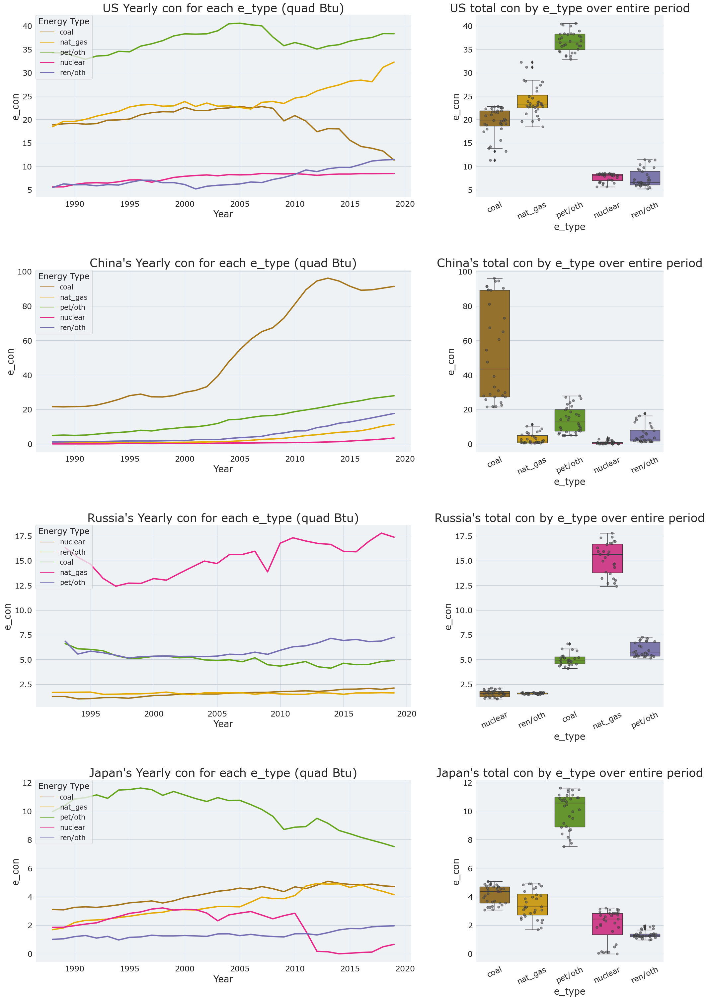

In [58]:
fig, ax = plt.subplots(4, 2, figsize = (20, 30), # constrained_layout = True,
                               gridspec_kw = {'width_ratios': [6, 3], 
                                                'height_ratios': [4, 4, 4, 4]})

ax_flat = ax.flatten()


# 1st graph
sns.lineplot(ax=ax_flat[0], data=df[df['Country']=='United States'][df['e_type']!='all'],
            x='Year',
            y='e_con',
            hue='e_type',
            lw=3,
            ).set_title('US Yearly con for each e_type (quad Btu)')

ax_flat[0].legend(fontsize=15, title='Energy Type', title_fontsize=18, loc='upper left', borderaxespad=0)
    

# 2nd graph
sns.stripplot(ax=ax_flat[1], data=df[df['Country']=='United States'][df['e_type']!='all'],
            x='e_type', y='e_con', jitter=.3, linewidth=0.9, size=5, alpha=.6, color=".3"
            )

sns.boxplot(ax=ax_flat[1], data=df[df['Country']=='United States'][df['e_type']!='all'],
            x='e_type', y='e_con', linewidth=1
            ).set_title('US total con by e_type over entire period')
ax_flat[1].tick_params(axis='x', rotation=25)


# 3rd graph
sns.lineplot(ax=ax_flat[2], data=df[df['Country']=='China'][df['e_type']!='all'],
            x='Year',
            y='e_con',
            hue='e_type',
            lw=3,
            ).set_title('China\'s Yearly con for each e_type (quad Btu)')

ax_flat[2].legend(fontsize=15, title='Energy Type', title_fontsize=18, loc='upper left', borderaxespad=0)


# 4th graph
sns.stripplot(ax=ax_flat[3], data=df[df['Country']=='China'][df['e_type']!='all'],
            x='e_type', y='e_con', jitter=.3, linewidth=0.9, size=5, alpha=.6, color=".3"
            )

sns.boxplot(ax=ax_flat[3], data=df[df['Country']=='China'][df['e_type']!='all'],
            x='e_type', y='e_con', linewidth=1
            ).set_title('China\'s total con by e_type over entire period')
ax_flat[3].tick_params(axis='x', rotation=25)


# 5th graph
sns.lineplot(ax=ax_flat[4], data=df[df['Country']=='Russia'][df['e_type']!='all'],
            x='Year',
            y='e_con',
            hue='e_type',
            lw=3,
            ).set_title('Russia\'s Yearly con for each e_type (quad Btu)')

ax_flat[4].legend(fontsize=15, title='Energy Type', title_fontsize=18, loc='upper left', borderaxespad=0)


# 6th graph
sns.stripplot(ax=ax_flat[5], data=df[df['Country']=='Russia'][df['e_type']!='all'],
            x='e_type', y='e_con', jitter=.3, linewidth=0.9, size=5, alpha=.6, color=".3"
            )

sns.boxplot(ax=ax_flat[5], data=df[df['Country']=='Russia'][df['e_type']!='all'],
            x='e_type', y='e_con', linewidth=1
            ).set_title('Russia\'s total con by e_type over entire period')
ax_flat[5].tick_params(axis='x', rotation=25)


# 7th graph
sns.lineplot(ax=ax_flat[6], data=df[df['Country']=='Japan'][df['e_type']!='all'],
            x='Year',
            y='e_con',
            hue='e_type',
            lw=3,
            ).set_title('Japan\'s Yearly con for each e_type (quad Btu)')

ax_flat[6].legend(fontsize=15, title='Energy Type', title_fontsize=18, loc='upper left', borderaxespad=0)


# 8th graph
sns.stripplot(ax=ax_flat[7], data=df[df['Country']=='Japan'][df['e_type']!='all'],
            x='e_type', y='e_con', jitter=.3, linewidth=0.9, size=5, alpha=.6, color=".3"
            )

sns.boxplot(ax=ax_flat[7], data=df[df['Country']=='Japan'][df['e_type']!='all'],
            x='e_type', y='e_con', linewidth=1
            ).set_title('Japan\'s total con by e_type over entire period')
ax_flat[7].tick_params(axis='x', rotation=25)
    
    
plt.tight_layout(pad=0.2, w_pad=3, h_pad=3)
plt.show()

Things to Notice:

United States:
Petroleum/other liquids and Natural Gas are the most consumed energy types
Starting around 2005 to 2019, Coal consumption has dropped by nearly 50%, and in 2019 it is now around the same consumption rate as Renewables

China:
Coal is the most consumed energy type
All other energy tppes have been slowly rising in consumption over the time period

Russia:
Natural Gas is the most consumed energy type
Nuclear and Renewables have stayed around the same level throughout the entire time period

Japan:
Petroleum/other liquids are the most used energy types
Nuclear consumption dropped nearly to 0 after 2011, which happens to be when the Fukushima nuclear disaster occured, but it seems to have picked up consumption again later around 2017.

## Total Consumed of each energy type for top 4 consumers over entire period

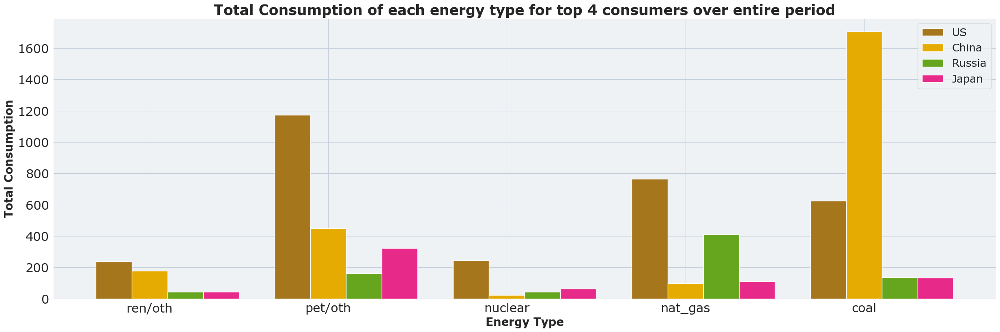

In [59]:
# e_type columns
types = ['coal', 'nat_gas', 'pet/oth', 'nuclear', 'ren/oth']

# Top 4 consumers
top_four = top_con['Country'].head(4).to_list()

list = []
for type in types:
    
    for country in top_four:
        amount = df[df['Country']==country][df['e_type']==type]['e_con'].sum()
        list.extend([[country, type, amount]])
    
# Temporary dataframe
temp = pd.DataFrame(list, columns=['Country', 'e_type', 'sum_con']).sort_values(by=['e_type', 'sum_con'], ascending=False).reset_index(drop=True)

# set width of bars
barWidth = 0.20

# set heights of bars
us_bar = temp[temp['Country']=='United States']['sum_con'].to_list()
ch_bar = temp[temp['Country']=='China']['sum_con'].to_list()
ru_bar = temp[temp['Country']=='Russia']['sum_con'].to_list()
sa_bar = temp[temp['Country']=='Japan']['sum_con'].to_list()

    
# Set position of bar on X axis
r_us = np.arange(len(types))
r_ch = [x + barWidth for x in r_us]
r_ru = [x + barWidth for x in r_ch]
r_jp = [x + barWidth for x in r_ru]

# Make the plot
plt.figure(figsize = (30, 9))
plt.bar(r_us, us_bar, width=barWidth, edgecolor='white', label='US')
plt.bar(r_ch, ch_bar, width=barWidth, edgecolor='white', label='China')
plt.bar(r_ru, ru_bar, width=barWidth, edgecolor='white', label='Russia')
plt.bar(r_jp, sa_bar, width=barWidth, edgecolor='white', label='Japan')

plt.title('Total Consumption of each energy type for top 4 consumers over entire period', fontweight='bold')
plt.ylabel('Total Consumption', fontweight='bold')
plt.yticks(fontsize=22)
plt.xlabel('Energy Type', fontweight='bold')
plt.xticks([r + barWidth for r in range(len(us_bar))], ['ren/oth', 'pet/oth', 'nuclear', 'nat_gas', 'coal'], fontsize=22)
plt.legend()
plt.show()

## Who consumes the most clean/dirty energy worldwide?

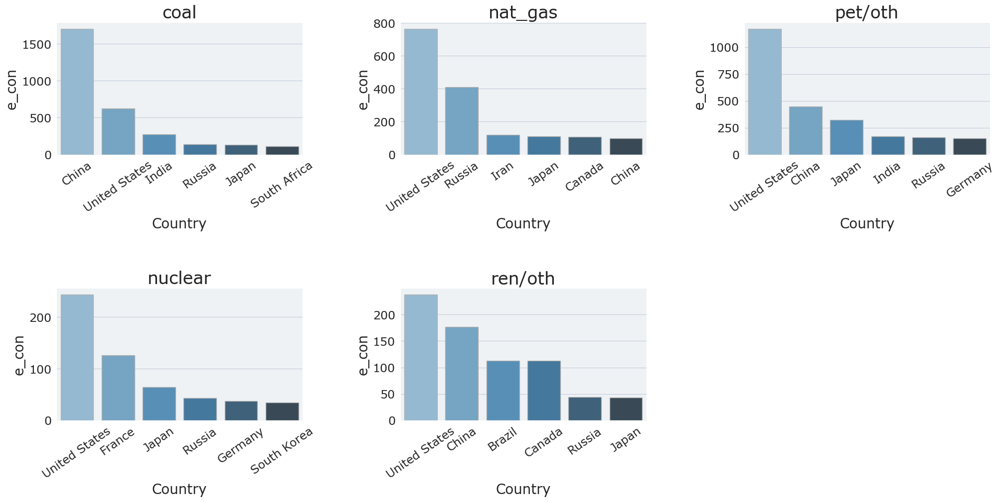

In [60]:
# Top 4 Dirty energy consumers worldwide 
fig, ax = plt.subplots(2, 3, figsize = (20, 10))
    
    
# e_type columns
types = ['coal', 'nat_gas', 'pet/oth', 'nuclear', 'ren/oth']

# excluding world
con3 = df[df['Country']!='World'].reset_index()   
    

for idx, (type, axes) in enumerate(zip(types, ax.flatten())):
    
    dirty = con3[con3['e_type']==type].groupby(['Country'])['e_con'].sum().reset_index().sort_values(by='e_con', ascending=False)
    
    sns.barplot(ax=axes, data=dirty.head(6), x='Country', y='e_con', palette="Blues_d")
    
    # Title
    axes.set_title(f'{type}')
    
     # Rotating X axis
    for tick in axes.get_xticklabels():
        tick.set_rotation(35)
    

### Removing empty figures
else:
    [axes.set_visible(False) for axes in ax.flatten()[idx + 1:]]
    
plt.tight_layout(pad=0.2, w_pad=3, h_pad=3)
plt.show()

Over the entire time period the United States has been the dominant consumer of clean energy.

## Who consumed the most clean energy in the past 10 years?

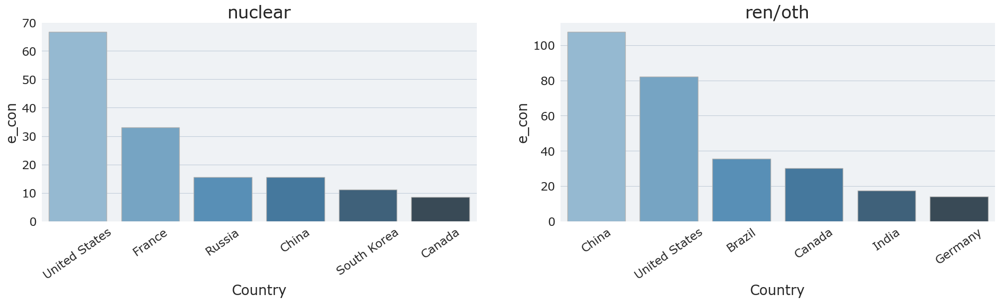

In [61]:
# Top 4 Dirty energy consumers worldwide 
fig, ax = plt.subplots(1, 2, figsize = (20, 6))
    
    
# e_type columns
dirty_types = ['nuclear', 'ren/oth']

# excluding world
con4 = df[df['Country']!='World'][df['Year']>=2012].reset_index()   
    

for idx, (type, axes) in enumerate(zip(dirty_types, ax.flatten())):
    
    dirty = con4[con4['e_type']==type].groupby(['Country'])['e_con'].sum().reset_index().sort_values(by='e_con', ascending=False)
    
    sns.barplot(ax=axes, data=dirty.head(6), x='Country', y='e_con', palette="Blues_d")
    
    # Title
    axes.set_title(f'{type}')
    
     # Rotating X axis
    for tick in axes.get_xticklabels():
        tick.set_rotation(35)
    

### Removing empty figures
else:
    [axes.set_visible(False) for axes in ax.flatten()[idx + 1:]]
    
plt.tight_layout(pad=0.2, w_pad=3, h_pad=3)
plt.show()

The United States is still the dominant consumer of nuclear energy, but as for renewables/other, China seems to have increased its consumption and surpassed The United States in becoming the dominant consumer of renewables.

## CO2 Emission, Energy Intensity by GDP and Energy Intensity per Capita of top 4 consumers

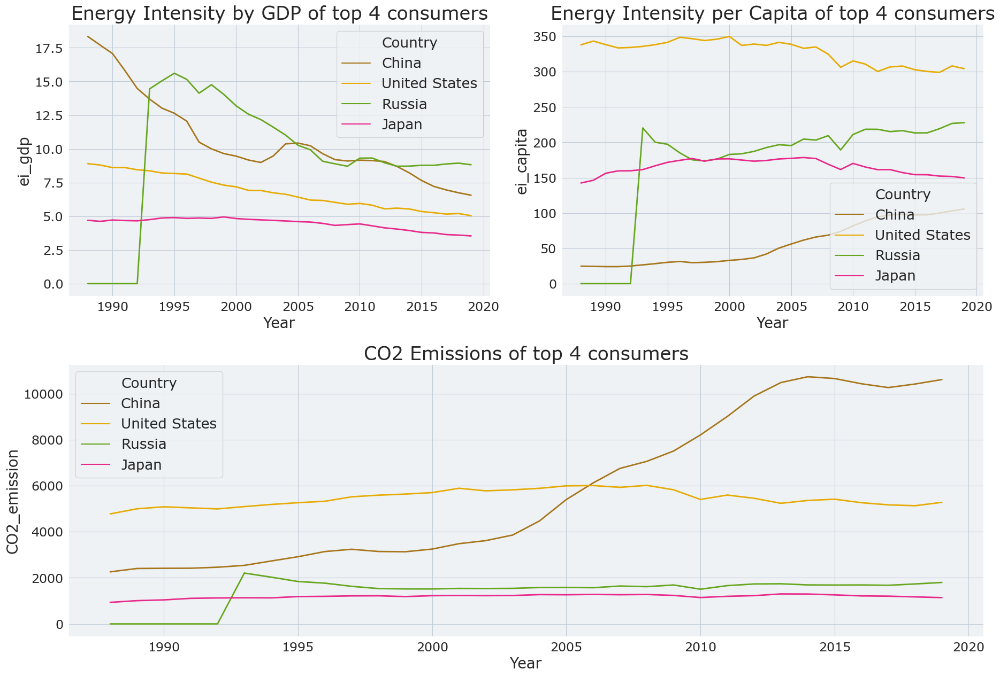

In [62]:
con5 = df[df['Country']!='World'][df['e_type']=='all'].reset_index()

# Years
years = con5['Year'].unique()

# List of top 6 countries with largest population in 2019 
top_four = ['China', 'United States', 'Russia', 'Japan']

# For ei_gdp
list = []
for year in years:
    for cont in top_four:
        amount = con5[con5['Country']==cont][con5['Year']==year]['ei_gdp'].sum()
        list.extend([[cont, year, amount]])

    # Temporary dataframe
temp_con5 = pd.DataFrame(list, columns=['Country', 'Year', 'ei_gdp'])


# For ei_capita
list2 = []
for year in years:
    for cont in top_four:
        amount = con5[con5['Country']==cont][con5['Year']==year]['ei_capita'].sum()
        list2.extend([[cont, year, amount]])

    # Temporary dataframe
temp_con52 = pd.DataFrame(list2, columns=['Country', 'Year', 'ei_capita'])


# For C02_emission
list3 = []
for year in years:
    for cont in top_four:
        amount = con5[con5['Country']==cont][con5['Year']==year]['CO2_emission'].sum()
        list3.extend([[cont, year, amount]])

    # Temporary dataframe
temp_con53 = pd.DataFrame(list3, columns=['Country', 'Year', 'CO2_emission'])

# Graphing
plt.figure(figsize=(19,13))

    ### 1st graph
plt.subplot(221)
sns.lineplot(data=temp_con5,
            x='Year', y='ei_gdp', hue='Country', lw=2
            ).set_title('Energy Intensity by GDP of top 4 consumers')
#ax1.legend(fontsize=15, title='Country', title_fontsize=20, loc='upper left', borderaxespad=0)

    ### 2nd graph
plt.subplot(222)
sns.lineplot(data=temp_con52,
            x='Year', y='ei_capita', hue='Country', lw=2
            ).set_title('Energy Intensity per Capita of top 4 consumers')
#ax_2.legend(fontsize=15, title='Country', title_fontsize=20, loc='upper left', borderaxespad=0)

    ### 3rd graph
plt.subplot(212)
sns.lineplot(data=temp_con53,
            x='Year', y='CO2_emission', hue='Country', lw=2
            ).set_title('CO2 Emissions of top 4 consumers')
#ax3.legend(fontsize=15, title='Country', title_fontsize=20, loc='upper left', borderaxespad=0)


plt.tight_layout(pad = 1)
plt.show()


### Overview of Energy Production Globally

Energy Production refers to the production of energy for each country. Depending on the energy type (e_type), you can find how much a country produced of the slected energy type. There are 6 energy types in this dataset, Coal, Natural Gas, Petroleum and other liquids, Nuclear, Renewables and other, and lastly total of all energy types.


From the industrial revolution onwards, fossil fuels have been the dominant energy source for the world, and in this day and age they still are unfortuanatlly. Many countries have been blessed with huge oil reserves, giving some the opportinity to grow there economies massively all off of this energy production alone. However when it comes to a countries ability to pull energy from the ground, you either have it or you dont, and if you dont, youll need to rely on the countries that do have it.


Although the world still relies heavily on fossil fuels, it'd be wrong to assume that countries havnt been taking drastic measures to change this in the past few decades. Converting from dirty to cleaner energy sources has been one of the biggest issues in the world and many strides have already been accomplished. Clean energy like solar power or wind turbines are now some of the cheapest energy sources in the world, and with each passing year, more and more countries are choosing to go more green.

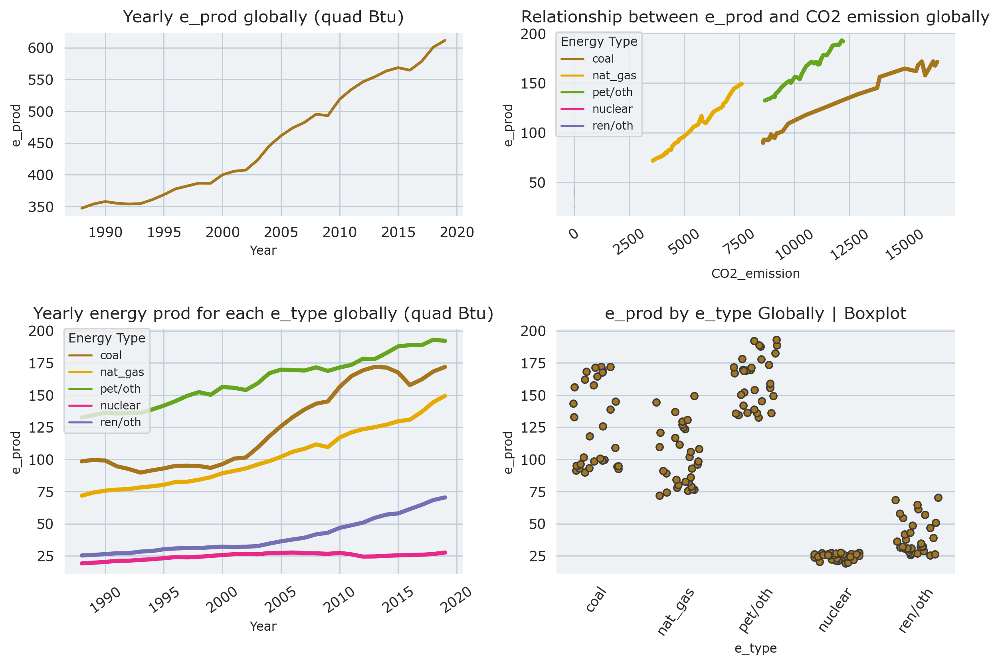

In [63]:
with plt.rc_context(rc = {'figure.dpi': 250, 'axes.labelsize': 9,
                          'xtick.labelsize': 10, 'ytick.labelsize': 10,
                          'legend.title_fontsize': 7, 'axes.titlesize': 12,
                          'axes.titlepad': 7}):

    # Specifying all countries == world
    prod = df[df['Country']=='World']
    
    
    fig_4, ax_4 = plt.subplots(2, 2, figsize = (10, 7), # constrained_layout = True,
                               gridspec_kw = {'width_ratios': [3, 3], 
                                                'height_ratios': [3, 4]})

    ax_flat = ax_4.flatten()

    
    ### 1st graph
    sns.lineplot(ax=ax_flat[0], data=prod[prod['e_type']=='all'],
             x='Year', y='e_prod', lw=2
            ).set_title('Yearly e_prod globally (quad Btu)')

    
    ### 2nd graph
    sns.lineplot(ax=ax_flat[1], data=prod[prod['e_type']!='all'],
            x='CO2_emission',
            y='e_prod',
            hue='e_type',
            lw=3,
            ).set_title('Relationship between e_prod and CO2 emission globally')
    
    
    ax_flat[1].legend(fontsize=8, title='Energy Type', title_fontsize=9, loc='upper left', borderaxespad=0)
    ax_flat[1].tick_params(axis='x', rotation=35)
    
    

    ### 3rd graph

    sns.lineplot(ax=ax_flat[2], data=prod[prod['e_type']!='all'],
            x='Year',
            y='e_prod',
            hue='e_type',
            lw=3,
            ).set_title('Yearly energy prod for each e_type globally (quad Btu)')
    
    
    ax_flat[2].legend(fontsize=8, title='Energy Type', title_fontsize=9, loc='upper left', borderaxespad=0)
    ax_flat[2].tick_params(axis='x', rotation=35)

    
    ### 4th graph
    sns.stripplot(ax=ax_flat[3], data=prod[prod['e_type']!='all'],
                x='e_type', y='e_prod', jitter=.3, linewidth=1
               ).set_title('e_prod by e_type Globally | Boxplot')

    ax_flat[3].tick_params(axis='x', rotation=55)
    
    plt.tight_layout(pad = 1)
    plt.show()

Things to notice:

Global Energy Production has nearly doubled over the time period
Petroleum/other liquids, Coal, and Natural gas have stayed the dominant energy source produced ove the years, although starting around 2003, renewables/other has picked up dramatically. Nuclear still seems to not have taken off as much

#### Production Percentage rate increase/decrease

In [64]:
# Specifying all countries == world, and e_type == all
prod0 = df[df['Country']=='World'][df['e_type']=='all'][['Year', 'e_prod']].reset_index(drop=True)

years = prod0['Year'].unique()

# For yearlly percentage change
temp_prod0 = prod0
temp_prod0['pct_change'] = temp_prod0['e_prod'].pct_change() * 100

# For overall percentage change
start = prod0.loc[prod0['Year']==1988] 
end = prod0.loc[prod0['Year']==2019]
temp_prod02 = pd.concat([start, end]).reset_index(drop=True)
    
temp_prod02['pct_change'] = temp_prod02['e_prod'].pct_change() * 100

# Plotting figure
fig = px.area(temp_prod0, x='Year', y='pct_change', title='Yearlly percent change of energy production')
fig.show()

print(f'The average yearly percentage change is {round(temp_prod0["pct_change"].mean(), 2)}%,\n and the overall percentage change from 1988 to 2019 is {round(temp_prod02["pct_change"].sum(), 2)}%')

The average yearly percentage change is 1.85%,
 and the overall percentage change from 1988 to 2019 is 76.02%


Total energy production globally has averaged around a 1.85% increase each year, and has overall increased by 76.02% from 1988 to 2019.

In [65]:
# Specifying all countries == world, and e_type == all
prod0 = df[df['Country']=='World'][df['e_type']!='all'][['Year','Country', 'e_type', 'e_prod']].reset_index(drop=True)

# coal
coal = prod0
coal['pct_change'] = prod0[prod0['e_type']=='coal']['e_prod'].pct_change() * 100
coal = coal[coal['pct_change'].notna()]

# nat_gas
nat_gas = prod0
nat_gas['pct_change'] = prod0[prod0['e_type']=='nat_gas']['e_prod'].pct_change() * 100
nat_gas = nat_gas[nat_gas['pct_change'].notna()]

# pet/oth
pet_oth = prod0
pet_oth['pct_change'] = prod0[prod0['e_type']=='pet/oth']['e_prod'].pct_change() * 100
pet_oth = pet_oth[pet_oth['pct_change'].notna()]

# nuclear
nuclear = prod0
nuclear['pct_change'] = prod0[prod0['e_type']=='nuclear']['e_prod'].pct_change() * 100
nuclear = nuclear[nuclear['pct_change'].notna()]

# ren/oth
ren_oth = prod0
ren_oth['pct_change'] = prod0[prod0['e_type']=='ren/oth']['e_prod'].pct_change() * 100
ren_oth = ren_oth[ren_oth['pct_change'].notna()]

# Rejoining all the datasets back together
final_df = pd.concat([coal, nat_gas, pet_oth, nuclear, ren_oth], axis=0)

fig = px.area(final_df, x='Year', y='pct_change', facet_col='e_type', color='e_type', facet_col_wrap=2, 
             title='Yearlly percentage rate increase/decrease of the production of each energy type')
fig.show()

Each energy type seems to have been having an overall positive yearly increase. Another thing to notice is that in 2011 and 2012 there was a sharp decline of around 4% and 6% respectively in nuclear production, which happens to be around the time after the Fukushima incident.


### Top Producers

In [66]:
# Making temp dataset of all countries and there total CO2 emissions in the time period

# Specifying all countreis != world, as well as all energy types
prod1 = df[df['Country']!='World'][df['e_type']=='all']

list_prod = []

# Sum of all yearly production for all energy types
for country in prod1['Country'].unique():
    total_prod = prod1[prod1['Country']==country]['e_prod'].sum(axis=0)
    list_prod.extend([[country, total_prod]])

    
# Temporary dataset of all the Countries and there respective total Production over the time period
top_prod = pd.DataFrame(list_prod, columns=['Country', 'Total_prod']).sort_values(by='Total_prod',ascending=False)

# Plotting the top 20 Producers
fig = px.bar(top_prod.head(20), x='Country', y='Total_prod', title='Top 20 Energy Producers over the time period (quad Btu)')
fig.show()

### Choropleth

In [67]:
prod2 = df[df['Country']!='World'][df['e_type']=='all']

temp_prod2 = prod2[['Country', 'Year', 'e_prod']].groupby(['Country','Year']).sum().reset_index()

px.choropleth(data_frame=temp_prod2, locations="Country", locationmode='country names', animation_frame="Year",
              color='e_prod', title="Energy Production of each country from 1988 to 2019 (quad Btu)")

The overwhelming majority of energy produced comes from either North America, Asia, East Asia or the Middle East. Reffering to what I said at the beggining of the section, either a country has the resources or it doesnt, it seems the countreis in these regions mentioned above have been blessed with these resoucres. Another thing to note is that the countries with the largest energy production also all have fairly large economies or standards of living.

### What energy types do the top 5 producers make?

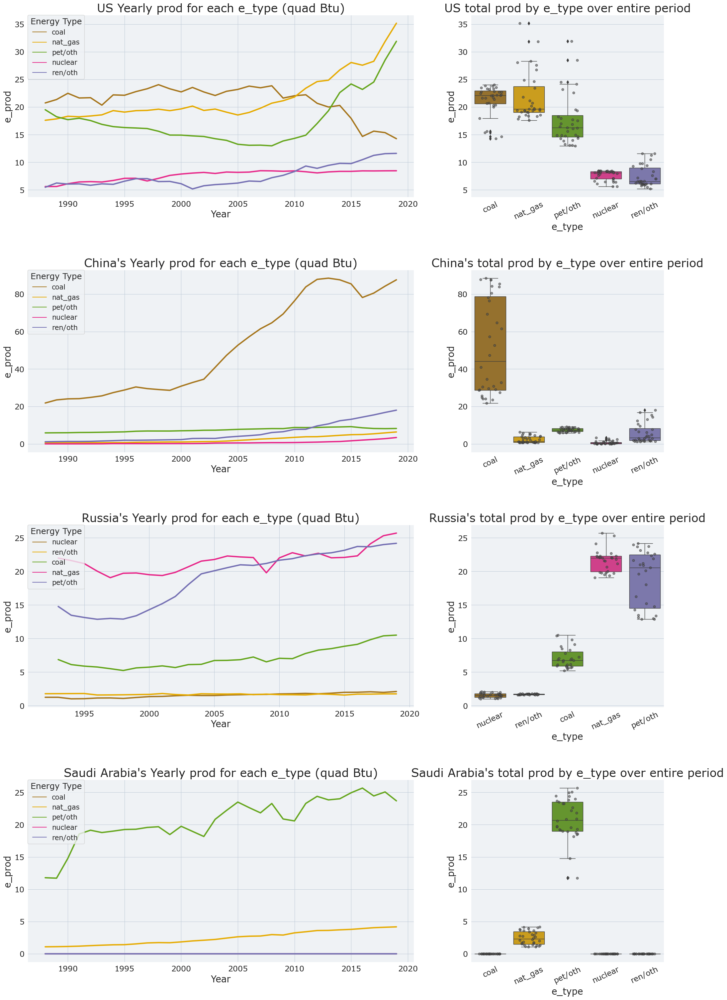

In [68]:
fig, ax = plt.subplots(4, 2, figsize = (20, 30), # constrained_layout = True,
                               gridspec_kw = {'width_ratios': [6, 3], 
                                                'height_ratios': [4, 4, 4, 4]})

ax_flat = ax.flatten()


# 1st graph
sns.lineplot(ax=ax_flat[0], data=df[df['Country']=='United States'][df['e_type']!='all'],
            x='Year',
            y='e_prod',
            hue='e_type',
            lw=3,
            ).set_title('US Yearly prod for each e_type (quad Btu)')

ax_flat[0].legend(fontsize=15, title='Energy Type', title_fontsize=18, loc='upper left', borderaxespad=0)
    

# 2nd graph
sns.stripplot(ax=ax_flat[1], data=df[df['Country']=='United States'][df['e_type']!='all'],
            x='e_type', y='e_prod', jitter=.3, linewidth=0.9, size=5, alpha=.6, color=".3"
            )

sns.boxplot(ax=ax_flat[1], data=df[df['Country']=='United States'][df['e_type']!='all'],
            x='e_type', y='e_prod', linewidth=1
            ).set_title('US total prod by e_type over entire period')
ax_flat[1].tick_params(axis='x', rotation=25)


# 3rd graph
sns.lineplot(ax=ax_flat[2], data=df[df['Country']=='China'][df['e_type']!='all'],
            x='Year',
            y='e_prod',
            hue='e_type',
            lw=3,
            ).set_title('China\'s Yearly prod for each e_type (quad Btu)')

ax_flat[2].legend(fontsize=15, title='Energy Type', title_fontsize=18, loc='upper left', borderaxespad=0)


# 4th graph
sns.stripplot(ax=ax_flat[3], data=df[df['Country']=='China'][df['e_type']!='all'],
            x='e_type', y='e_prod', jitter=.3, linewidth=0.9, size=5, alpha=.6, color=".3"
            )

sns.boxplot(ax=ax_flat[3], data=df[df['Country']=='China'][df['e_type']!='all'],
            x='e_type', y='e_prod', linewidth=1
            ).set_title('China\'s total prod by e_type over entire period')
ax_flat[3].tick_params(axis='x', rotation=25)


# 5th graph
sns.lineplot(ax=ax_flat[4], data=df[df['Country']=='Russia'][df['e_type']!='all'],
            x='Year',
            y='e_prod',
            hue='e_type',
            lw=3,
            ).set_title('Russia\'s Yearly prod for each e_type (quad Btu)')

ax_flat[4].legend(fontsize=15, title='Energy Type', title_fontsize=18, loc='upper left', borderaxespad=0)


# 6th graph
sns.stripplot(ax=ax_flat[5], data=df[df['Country']=='Russia'][df['e_type']!='all'],
            x='e_type', y='e_prod', jitter=.3, linewidth=0.9, size=5, alpha=.6, color=".3"
            )

sns.boxplot(ax=ax_flat[5], data=df[df['Country']=='Russia'][df['e_type']!='all'],
            x='e_type', y='e_prod', linewidth=1
            ).set_title('Russia\'s total prod by e_type over entire period')
ax_flat[5].tick_params(axis='x', rotation=25)


# 7th graph
sns.lineplot(ax=ax_flat[6], data=df[df['Country']=='Saudi Arabia'][df['e_type']!='all'],
            x='Year',
            y='e_prod',
            hue='e_type',
            lw=3,
            ).set_title('Saudi Arabia\'s Yearly prod for each e_type (quad Btu)')

ax_flat[6].legend(fontsize=15, title='Energy Type', title_fontsize=18, loc='upper left', borderaxespad=0)


# 8th graph
sns.stripplot(ax=ax_flat[7], data=df[df['Country']=='Saudi Arabia'][df['e_type']!='all'],
            x='e_type', y='e_prod', jitter=.3, linewidth=0.9, size=5, alpha=.6, color=".3"
            )

sns.boxplot(ax=ax_flat[7], data=df[df['Country']=='Saudi Arabia'][df['e_type']!='all'],
            x='e_type', y='e_prod', linewidth=1
            ).set_title('Saudi Arabia\'s total prod by e_type over entire period')
ax_flat[7].tick_params(axis='x', rotation=25)

    
plt.tight_layout(pad=0.2, w_pad=3, h_pad=3)
plt.show()

Things to notice:

United States
Largest production is in natural gas and petroleum/other liquids
Decreasing coal production over the years
Slight increase in the production of renewables/other in recent years
Nuclear seems to be steady, although there has been a very small increase in production over the years

China
Largest production is in coal, major producer it looks like
Slight increase in renewables/other production over the years
Very small increase in natural gas and nuclear in recent years
All other enrgy types seem to be at more or less the same production rate

Russia
Largest production is in natrual gas and petroleum/other liquids
Almost no production of nuclear and renewables/other

Saudi Arabia
Largest production is in petroleum/other liquids
very small increase in natural gas production over the years

Extra:

One other thing I noticed that is quite interesting is that around 2012-2013, China surpassed the US in the production of renewable energy.

### Total Produced of each energy type for top 4 producers over entire period

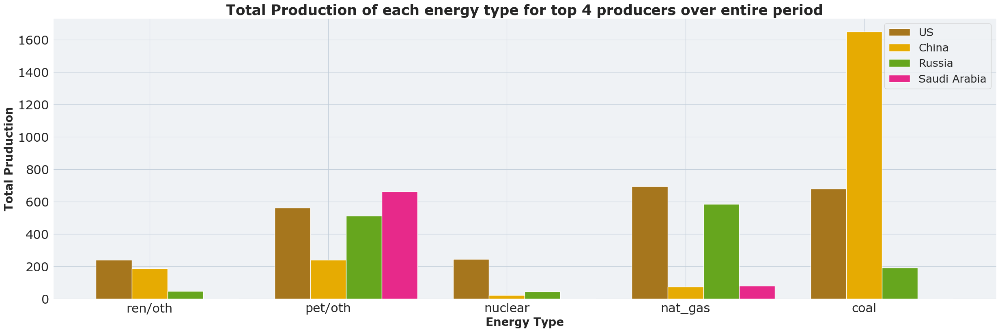

In [69]:
# e_type columns
types = ['coal', 'nat_gas', 'pet/oth', 'nuclear', 'ren/oth']

# Top 4 producers
top_four = top_prod['Country'].head(4).to_list()

list = []
for type in types:
    
    for country in top_four:
        amount = df[df['Country']==country][df['e_type']==type]['e_prod'].sum()
        list.extend([[country, type, amount]])
    
# Temporary dataframe
temp = pd.DataFrame(list, columns=['Country', 'e_type', 'sum_prod']).sort_values(by=['e_type', 'sum_prod'], ascending=False).reset_index(drop=True)

# set width of bars
barWidth = 0.20

# set heights of bars
us_bar = temp[temp['Country']=='United States']['sum_prod'].to_list()
ch_bar = temp[temp['Country']=='China']['sum_prod'].to_list()
ru_bar = temp[temp['Country']=='Russia']['sum_prod'].to_list()
sa_bar = temp[temp['Country']=='Saudi Arabia']['sum_prod'].to_list()

    
# Set position of bar on X axis
r_us = np.arange(len(types))
r_ch = [x + barWidth for x in r_us]
r_ru = [x + barWidth for x in r_ch]
r_sa = [x + barWidth for x in r_ru]

# Make the plot
plt.figure(figsize = (30, 9))
plt.bar(r_us, us_bar, width=barWidth, edgecolor='white', label='US')
plt.bar(r_ch, ch_bar, width=barWidth, edgecolor='white', label='China')
plt.bar(r_ru, ru_bar, width=barWidth, edgecolor='white', label='Russia')
plt.bar(r_sa, sa_bar, width=barWidth, edgecolor='white', label='Saudi Arabia')

plt.title('Total Production of each energy type for top 4 producers over entire period', fontweight='bold')
plt.ylabel('Total Pruduction', fontweight='bold')
plt.yticks(fontsize=22)
plt.xlabel('Energy Type', fontweight='bold')
plt.xticks([r + barWidth for r in range(len(us_bar))], ['ren/oth', 'pet/oth', 'nuclear', 'nat_gas', 'coal'], fontsize=22)
plt.legend()
plt.show()

### Who produces the most clean/dirty energy worldwide?

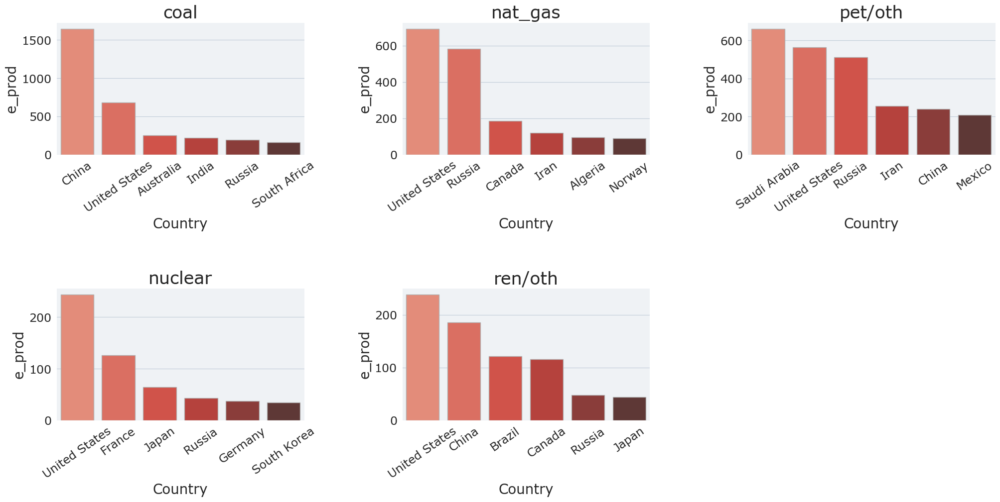

In [70]:
# Top 4 Dirty energy producers worldwide 
fig, ax = plt.subplots(2, 3, figsize = (20, 10))
    
    
# e_type columns
types = ['coal', 'nat_gas', 'pet/oth', 'nuclear', 'ren/oth']

# excluding world
prod3 = df[df['Country']!='World'].reset_index()   
    

for idx, (type, axes) in enumerate(zip(types, ax.flatten())):
    
    dirty = prod3[prod3['e_type']==type].groupby(['Country'])['e_prod'].sum().reset_index().sort_values(by='e_prod', ascending=False)
    
    sns.barplot(ax=axes, data=dirty.head(6), x='Country', y='e_prod', palette="Reds_d")
    
    # Title
    axes.set_title(f'{type}')
    
     # Rotating X axis
    for tick in axes.get_xticklabels():
        tick.set_rotation(35)
    

### Removing empty figures
else:
    [axes.set_visible(False) for axes in ax.flatten()[idx + 1:]]
    
plt.tight_layout(pad=0.2, w_pad=3, h_pad=3)
plt.show()

Seems that over the entire time period, The United States has been the dominant producer of clean energy.

### Who produced the most clean energy in the past 10 years?

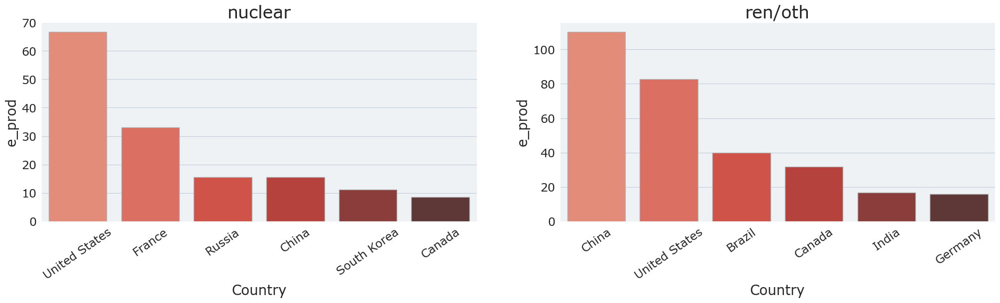

In [71]:
# Top 4 Dirty energy producers worldwide 
fig, ax = plt.subplots(1, 2, figsize = (20, 6))
    
    
# e_type columns
dirty_types = ['nuclear', 'ren/oth']

# excluding world
prod4 = df[df['Country']!='World'][df['Year']>=2012].reset_index()   
    

for idx, (type, axes) in enumerate(zip(dirty_types, ax.flatten())):
    
    dirty = prod4[prod4['e_type']==type].groupby(['Country'])['e_prod'].sum().reset_index().sort_values(by='e_prod', ascending=False)
    
    sns.barplot(ax=axes, data=dirty.head(6), x='Country', y='e_prod', palette="Reds_d")
    
    # Title
    axes.set_title(f'{type}')
    
     # Rotating X axis
    for tick in axes.get_xticklabels():
        tick.set_rotation(35)
    

### Removing empty figures
else:
    [axes.set_visible(False) for axes in ax.flatten()[idx + 1:]]
    
plt.tight_layout(pad=0.2, w_pad=3, h_pad=3)
plt.show()

The United States is still the dominant producer of nuclear energy, but as for renewables/other, China seems to have picked up its production and surpassed The United States in becoming the dominant producer of renewables.

### CO2 Emission, Energy Intensity by GDP, and Energy Intensity per Capita of top 4 producers

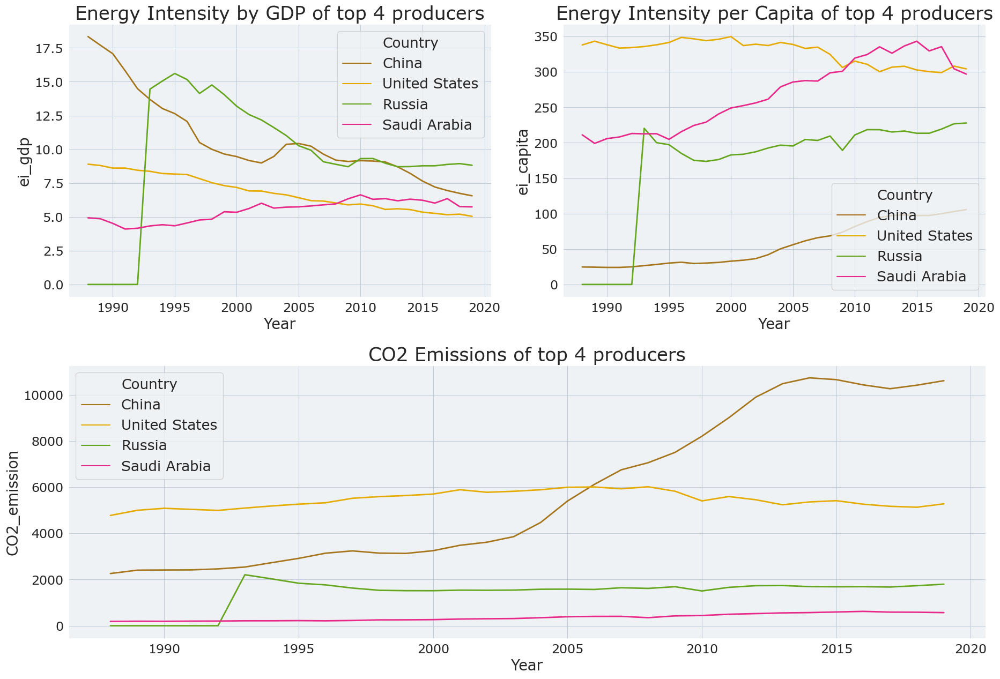

In [72]:
prod5 = df[df['Country']!='World'][df['e_type']=='all'].reset_index()

# Years
years = prod5['Year'].unique()

# List of top 4 producers
top_four = ['China', 'United States', 'Russia', 'Saudi Arabia']


# For ei_gdp
list = []
for year in years:
    for cont in top_four:
        amount = prod5[prod5['Country']==cont][prod5['Year']==year]['ei_gdp'].sum()
        list.extend([[cont, year, amount]])

    # Temporary dataframe
temp_prod5 = pd.DataFrame(list, columns=['Country', 'Year', 'ei_gdp'])


# For ei_capita
list2 = []
for year in years:
    for cont in top_four:
        amount = prod5[prod5['Country']==cont][prod5['Year']==year]['ei_capita'].sum()
        list2.extend([[cont, year, amount]])

    # Temporary dataframe
temp_prod52 = pd.DataFrame(list2, columns=['Country', 'Year', 'ei_capita'])


# For C02_emission
list3 = []
for year in years:
    for cont in top_four:
        amount = prod5[prod5['Country']==cont][prod5['Year']==year]['CO2_emission'].sum()
        list3.extend([[cont, year, amount]])

    # Temporary dataframe
temp_prod53 = pd.DataFrame(list3, columns=['Country', 'Year', 'CO2_emission'])

# Graphing
plt.figure(figsize=(19,13))

    ### 1st graph
plt.subplot(221)
sns.lineplot(data=temp_prod5,
            x='Year', y='ei_gdp', hue='Country', lw=2
            ).set_title('Energy Intensity by GDP of top 4 producers')
#ax1.legend(fontsize=15, title='Country', title_fontsize=20, loc='upper left', borderaxespad=0)

    ### 2nd graph
plt.subplot(222)
sns.lineplot(data=temp_prod52,
            x='Year', y='ei_capita', hue='Country', lw=2
            ).set_title('Energy Intensity per Capita of top 4 producers')
#ax_2.legend(fontsize=15, title='Country', title_fontsize=20, loc='upper left', borderaxespad=0)

    ### 3rd graph
plt.subplot(212)
sns.lineplot(data=temp_prod53,
            x='Year', y='CO2_emission', hue='Country', lw=2
            ).set_title('CO2 Emissions of top 4 producers')
#ax3.legend(fontsize=15, title='Country', title_fontsize=20, loc='upper left', borderaxespad=0)


plt.tight_layout(pad = 1)
plt.show()

### Overview on CO2 Emission

CO2 Emission refers to the Carbon Dioxide emitted throughout the world. In this dataset it is broadly catategorizing all emitters, transportation, lifestyle, industry etc.. into one total amount for each energy type.

CO2 emissions from the burning of fossil fuels are the primary cause of global warming which happens to be one of the biggest threats facing humanity in this day and age. Although there are plenty of other emissions that are emitted on this earth, including Methane, nitrous oxide, and CFCs, none compare to the emission of CO2, and we as humans are mostly to blame for this. For this analysis I will be focosing on CO2 Emissions and its effect on the world we live in as well as some key factors and stats that may play a role in the emission of CO2 globally.

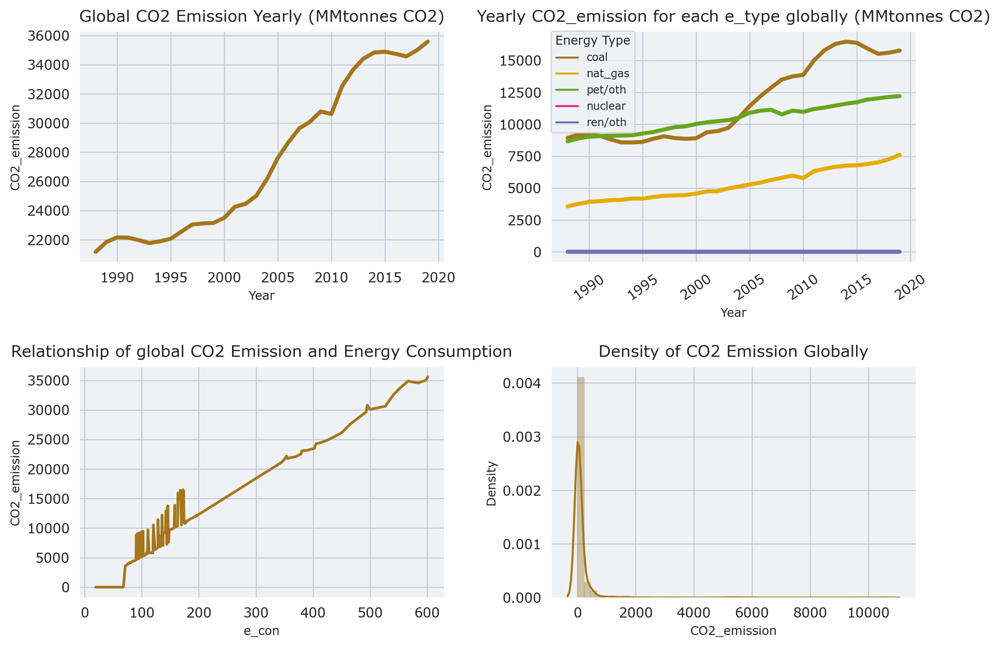

In [73]:
with plt.rc_context(rc = {'figure.dpi': 250, 'axes.labelsize': 9,
                          'xtick.labelsize': 10, 'ytick.labelsize': 10,
                          'legend.title_fontsize': 7, 'axes.titlesize': 12,
                          'axes.titlepad': 7}):

    # Data with only the 'World' values
    cd = df[df['Country']=='World']

    
    fig, ax = plt.subplots(2, 2, figsize = (10, 7), # constrained_layout = True,
                               gridspec_kw = {'width_ratios': [3, 3], 
                                                'height_ratios': [3, 3]})

    ax_flat = ax.flatten()

    
    ### 1st graph
    sns.lineplot(ax=ax_flat[0], data=cd[cd['e_type']=='all'],
                 x='Year', y='CO2_emission', lw=3).set_title('Global CO2 Emission Yearly (MMtonnes CO2)')

    
    ### 2nd graph
    sns.lineplot(ax=ax_flat[1], data=cd[cd['e_type']!='all'],
            x='Year',
            y='CO2_emission',
            hue='e_type',
            lw=3,
            ).set_title('Yearly CO2_emission for each e_type globally (MMtonnes CO2)')
    
    ax_flat[1].legend(fontsize=8, title='Energy Type', title_fontsize=9, loc='upper left', borderaxespad=0)
    ax_flat[1].tick_params(axis='x', rotation=35)
    
    
    ### 3rd graph
    sns.lineplot(ax=ax_flat[2], data=cd,
                x='e_con', y='CO2_emission', lw=2
               ).set_title('Relationship of global CO2 Emission and Energy Consumption')
    
    
    ### 4th graph
    for_dist = df[df['Country']!='World'][df['e_type']=='all']
    sns.distplot(for_dist['CO2_emission'], ax=ax_flat[3]).set_title('Density of CO2 Emission Globally')

    
    plt.tight_layout(pad = 1)
    plt.show()

**IMPORTANT TO KNOW** - This dataset shows for all Nuclear and Renewables/other energy types that they emit zero CO2 emissions, this technacially isnt true. They do emit CO2, but it is so insignificant that id be hard to notice, especially when measuring by million metric tonnes (MMtonnes CO2). Im only saying this because this dataset has zero set for the CO2 emission of both these energy types and that is somewhat misleading

### CO2 Emission percentage rate increase/decrease

In [74]:
# Specifying all countries == world, and e_type == all
cd0 = df[df['Country']=='World'][df['e_type']=='all'][['Year', 'CO2_emission']].reset_index(drop=True)

# For yearlly percentage change
temp_cd0 = cd0
temp_cd0['pct_change'] = temp_cd0['CO2_emission'].pct_change() * 100

# For overall percentage change
temp_cd02 = cd0

keep = [1988, 2019]
for year in temp_cd02['Year'].unique():
    if year not in keep:
        temp_cd02 = temp_cd02[temp_cd02['Year']!=year]
        
temp_cd02['pct_change'] = temp_cd02['CO2_emission'].pct_change() * 100

# Plotting figure
fig = px.area(temp_cd0, x='Year', y='pct_change', title='CO2 Emission percentage rate increase/decrease each year')
fig.show()

print(f'The average yearly percentage change is {round(temp_cd0["pct_change"].mean(), 2)}%,\n and the overall percentage change from 1988 to 2019 is {round(temp_cd02["pct_change"].sum(), 2)}%')

The average yearly percentage change is 1.71%,
 and the overall percentage change from 1988 to 2019 is 68.14%


CO2 Emission has been increasing 1.71% yearlly on average, and has overall increased by 68.14% over the entire time period.

### Yearly Mean, Median and Standard Deviation of each countries CO2 Emission

In [75]:
# Dot chart showing yearlly mean, sd, and median
sample = df[df['Country']!='World'][df['e_type']=='all']

years = sample['Year'].unique()

# Mean
list_m = []
for year in years:
    amount = sample[sample['Year']==year]['CO2_emission'].mean()
    list_m.extend([[year, amount]])

temp_mean = pd.DataFrame(list_m, columns=['Year', 'co2_mean'])
temp_mean['co2_mean'] = round(temp_mean['co2_mean'], 2)


# Median
list_med = []
for year in years:
    amount = sample[sample['Year']==year]['CO2_emission'].median()
    list_med.extend([[year, amount]])

temp_med = pd.DataFrame(list_med, columns=['Year', 'co2_med'])
temp_med['co2_med'] = round(temp_med['co2_med'], 2)


# Standard Deviation
list_sd = []
for year in years:
    amount = sample[sample['Year']==year]['CO2_emission'].std()
    list_sd.extend([[year, amount]])

temp_sd = pd.DataFrame(list_sd, columns=['Year', 'co2_sd'])
temp_sd['co2_sd'] = round(temp_sd['co2_sd'], 2)


# Plotting
fig = make_subplots(rows=3, cols=1)

fig.add_trace(
    go.Scatter(x=temp_mean['Year'], y=temp_mean['co2_mean'], mode="lines+markers"),
    row=1, col=1
)

fig.add_trace(
    go.Scatter(x=temp_med['Year'], y=temp_med['co2_med'], mode="lines+markers"),
    row=2, col=1
)

fig.add_trace(
    go.Scatter(x=temp_sd['Year'], y=temp_sd['co2_sd'], mode="lines+markers"),
    row=3, col=1
)

fig.update_yaxes(title_text="mean", row=1, col=1)
fig.update_yaxes(title_text="median", row=2, col=1)
fig.update_yaxes(title_text="std", row=3, col=1)
fig.update_traces(textposition="bottom center")
fig.update_layout(height=700, width=900, title_text="Yearly mean, median and std each countries CO2 Emission (MMtonnes CO2)")
fig.show()


# Overall
overall = df[df['Country']=='World'][df['e_type']=='all']
print(f'The worlds Mean value of CO2 Emission over the entire time period is {round(overall["CO2_emission"].mean(), 2)}.')
print(f'The worlds Median value of CO2 Emission over the entire time period is {round(overall["CO2_emission"].median(), 2)}.')
print(f'The Standard Deviation value of CO2 Emission over the entire time period is {round(overall["CO2_emission"].std(), 2)}.')

The worlds Mean value of CO2 Emission over the entire time period is 27434.91.
The worlds Median value of CO2 Emission over the entire time period is 25592.93.
The Standard Deviation value of CO2 Emission over the entire time period is 5256.78.


### Who produced the most CO2 Emissions over this time period?

In [76]:
# Making temp dataset of all countries and there total CO2 emissions in the time period

# Specifying all countreis != world, as well as all energy types
cd1 = df[df['Country']!='World'][df['e_type']=='all']

list = []

for country in cd1['Country'].unique():
    total = cd1[cd1['Country']==country]['CO2_emission'].sum(axis=0)
    list.extend([[country, total]])

    
# Temporary dataset of all the Countries and there respective total CO2 Emission over the time period
temp_cd = pd.DataFrame(list, columns=['Country', 'Total_CO2']).sort_values(by='Total_CO2',ascending=False)

# Plotting the top 20 Emiters
fig = px.bar(temp_cd.head(20), x='Country', y='Total_CO2', title='Top 20 CO2 Emitters (MMtonnes CO2)')
fig.show()

The top CO2 emitters are China and The US, both exceding nearly 4 times or more the amount of every other country!

### Choropleth

In [77]:
cd2 = df[df['Country']!='World'][df['e_type']=='all']

temp_cd2 = cd2[['Country', 'Year', 'CO2_emission']].groupby(['Country','Year']).sum().reset_index()

px.choropleth(data_frame=temp_cd2, locations="Country", locationmode='country names', animation_frame="Year",
              color='CO2_emission', title="CO2 Emission of each country from 1988 to 2019 (MMtonnes CO2)")

If we remove China and The United States, we can get a better picture of the other high CO2 emitters around the world.

In [78]:
# Without China and the US

temp5 = df[df['Country']!='World'][df['e_type']=='all']
temp5 = temp5[temp5['Country']!='United States']
temp5 = temp5[temp5['Country']!='China']

temp_temp5 = temp5[['Country', 'Year', 'CO2_emission']].groupby(['Country','Year']).sum().reset_index()

px.choropleth(data_frame=temp_temp5, locations="Country", locationmode='country names', animation_frame="Year",
              color='CO2_emission', title="CO2 Emission of each country from 1988 to 2019 (MMtonnes CO2)")

After removing China and the United States, we can now see some of the other big emitters including Russia, Japan, India and Germany.

### Yearly CO2 emissions of top 6 Countries over the time period

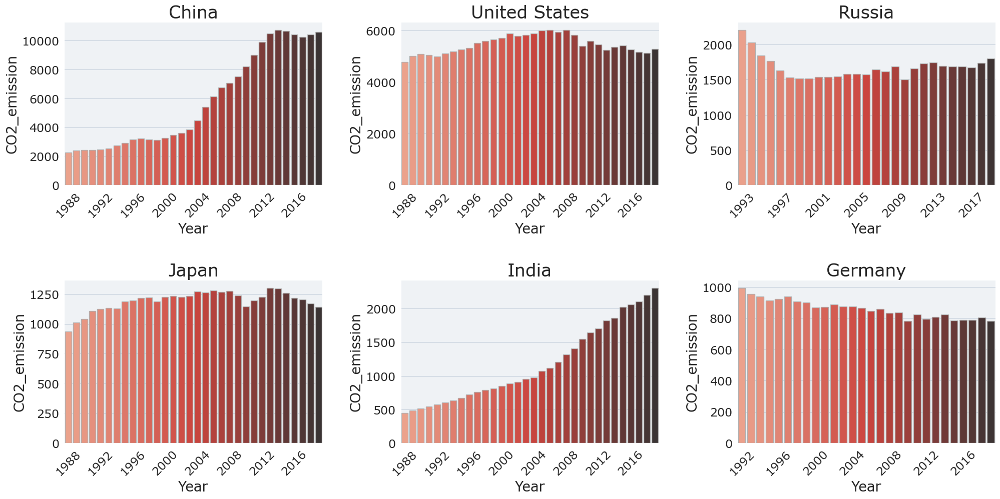

In [79]:
fig, ax = plt.subplots(2, 3, figsize = (20, 10))


# Top 6 Countries
countries = temp_cd['Country'].head(6)
    
# Average CO2 Emission each year for top 6 emiters
for idx, (country, axes) in enumerate(zip(countries, ax.flatten())):
        
    cd3 = df[df['Country']==country][df['e_type']=='all']
    temp_data = cd3.groupby(['Year'])['CO2_emission'].sum().reset_index().sort_values(by='CO2_emission',ascending=False)
    plot_ = sns.barplot(ax=axes, data=temp_data, x='Year', y='CO2_emission', palette="Reds_d")
    
    # Title
    axes.set_title(country)
    
    # Reducing Density of X-ticks
    for ind, label in enumerate(plot_.get_xticklabels()):
        if ind % 4 == 0:  # every 10th label is kept
            label.set_visible(True)
        else:
            label.set_visible(False)
    
    # Rotating X axis
    for tick in axes.get_xticklabels():
        tick.set_rotation(45)
    
    
### Removing empty figures
else:
    [axes.set_visible(False) for axes in ax.flatten()[idx + 1:]]
    

    
plt.tight_layout(pad=0.4, w_pad=2, h_pad=2)
plt.show()

China and India have increased there emissions a lot over the time period.

### Countries with the most drastic increase/decrease in CO2 emission from the start to end of this time period

In [80]:
# Total CO2 emission for each country
cd4 = df[df['Country']!='World'][df['e_type']=='all'].reset_index(drop=True)

countries = cd4['Country'].unique()

list_cont = []
list_start = []
list_end = []
for cont in countries:
    
    
    # Start date, default 1988 if created before time period
    start_date = cd4[cd4['Country']==cont]['Year'].min()
    # End date, default 2019 if still around
    end_date = cd4[cd4['Country']==cont]['Year'].max()
    
    # CO2 emissions of both the beggining and end every country within the timeperiod
    start_CO2 = float(cd4[cd4['Country']==cont][cd4['Year']==start_date]['CO2_emission'])
    end_CO2 = float(cd4[cd4['Country']==cont][cd4['Year']==end_date]['CO2_emission'])

    list_start.extend([start_CO2])
    list_end.extend([end_CO2])
    list_cont.extend([cont])

# Adding all lists into a dict
d = {'Country':list_cont, 'Start':list_start, 'End':list_end}

start_end = pd.DataFrame(d)

# Creating new column for the total difference from the start to end
start_end['Difference'] = start_end['End'] - start_end['Start']

# Sorting values by difference
start_end = start_end.sort_values(by='Difference', ascending=False).reset_index(drop=True)

start_end

,Country,Start,End,Difference
0,China,2259.81,10608.60,8348.79
1,India,446.21,2308.33,1862.12
2,United States,4775.55,5277.19,501.64
3,South Korea,207.60,702.96,495.36
4,Iran,165.31,642.96,477.65
...,...,...,...,...
189,Romania,190.58,73.68,-116.90
190,United Kingdom,608.72,411.17,-197.55
191,Germany,993.23,781.60,-211.63
192,Ukraine,594.18,202.51,-391.67


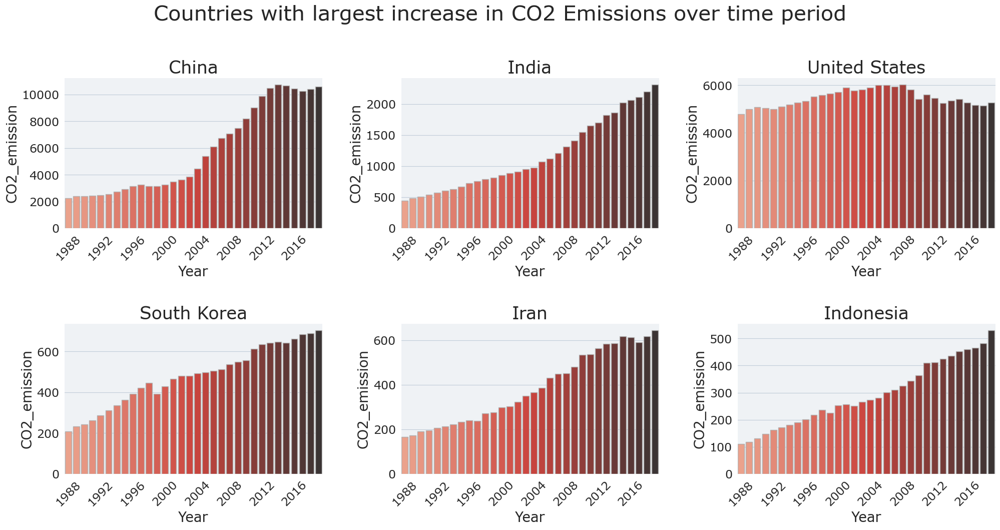

In [81]:
# Countries with biggest increase in CO2 emission
fig, ax = plt.subplots(2, 3, figsize = (20, 10))

# Countries with the biggest increase in CO2 emission
countries = start_end['Country'].head(6).to_list()

for idx, (country, axes) in enumerate(zip(countries, ax.flatten())):
        
    cd5 = df[df['Country']==country][df['e_type']=='all']
    temp_cd5 = cd5.groupby(['Year'])['CO2_emission'].sum().reset_index().sort_values(by='CO2_emission',ascending=False)
    plot_ = sns.barplot(ax=axes, data=temp_cd5, x='Year', y='CO2_emission', palette="Reds_d")
    
    # Title
    axes.set_title(country)
    
    # Reducing Density of X-ticks
    for ind, label in enumerate(plot_.get_xticklabels()):
        if ind % 4 == 0:  # every 10th label is kept
            label.set_visible(True)
        else:
            label.set_visible(False)
    
    # Rotating X axis
    for tick in axes.get_xticklabels():
        tick.set_rotation(45)
    
    
### Removing empty figures
else:
    [axes.set_visible(False) for axes in ax.flatten()[idx + 1:]]
    

plt.suptitle('Countries with largest increase in CO2 Emissions over time period', y=1.05, size=30)
plt.tight_layout(pad=0.4, w_pad=2, h_pad=2)
plt.show()

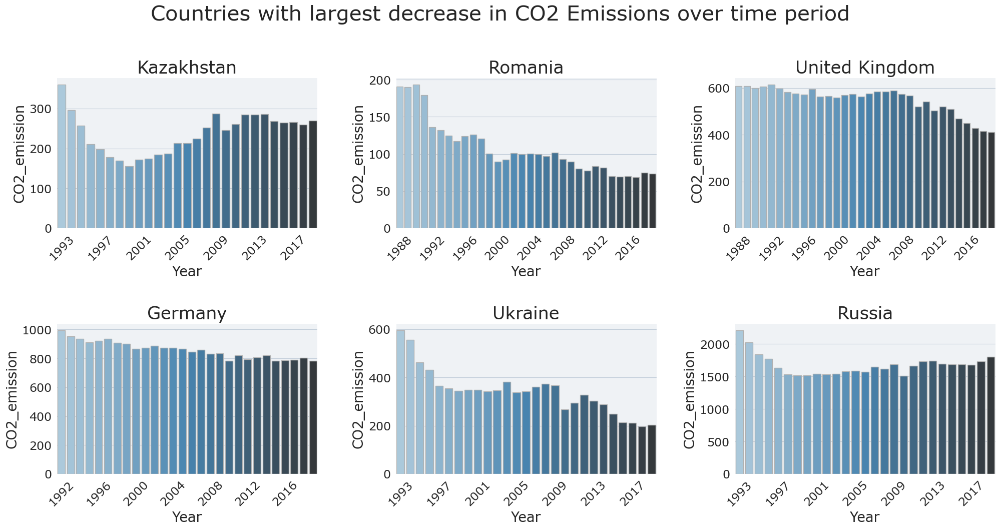

In [82]:
# Countries with biggest decrease in CO2 emission
fig, ax = plt.subplots(2, 3, figsize = (20, 10))

# Countries with the biggest decrease in CO2 emission
countries = start_end['Country'].tail(6).to_list()

for idx, (country, axes) in enumerate(zip(countries, ax.flatten())):
        
    cd6 = df[df['Country']==country][df['e_type']=='all']
    temp_data = cd6.groupby(['Year'])['CO2_emission'].sum().reset_index().sort_values(by='CO2_emission',ascending=False)
    plot_ = sns.barplot(ax=axes, data=temp_data, x='Year', y='CO2_emission', palette="Blues_d")
    
    # Title
    axes.set_title(country)
    
    # Reducing Density of X-ticks
    for ind, label in enumerate(plot_.get_xticklabels()):
        if ind % 4 == 0:  # every 10th label is kept
            label.set_visible(True)
        else:
            label.set_visible(False)
    
    # Rotating X axis
    for tick in axes.get_xticklabels():
        tick.set_rotation(45)
    
    
### Removing empty figures
else:
    [axes.set_visible(False) for axes in ax.flatten()[idx + 1:]]
    

plt.suptitle('Countries with largest decrease in CO2 Emissions over time period', y=1.05, size=30)
plt.tight_layout(pad=0.4, w_pad=2, h_pad=2)
plt.show()

The countries with the largest decrease in CO2 Emission are all moslty former soviet republics, I assume after the USSR fell there production/industry fell drastically, which in return decreased there emissions. Germany (technically apart of USSR, techinically not) and The United Kingdom have also decreased there emissions quite a bit over the time period.

### Top Countries with the largest Population and there CO2 emissions as of 2019

In [83]:
cd9 = df[df['Country']!='World'][df['Year']==2019][df['e_type']=='all']

# Sorting GDP from largest to smallest
cd9 = cd9.sort_values(['Population'], ascending=False).reset_index(drop=True)

# Showing the top 10 countries
cd9[['Country', 'Year', 'Population', 'CO2_emission']].head(10)

,Country,Year,Population,CO2_emission
0,China,2019,1434512.0,10608.60
1,India,2019,1368140.0,2308.33
2,United States,2019,330043.8,5277.19
3,Indonesia,2019,270984.0,529.40
4,Pakistan,2019,216564.0,192.90
5,Brazil,2019,211246.2,453.44
6,Nigeria,2019,201050.8,101.19
7,Bangladesh,2019,163021.0,90.78
8,Russia,2019,145876.3,1798.24
9,Mexico,2019,127745.8,456.15


In [84]:
# Plotting Bubble Chart

# Capturing country names
countries = cd9['Country'].unique()


# Creating hover stats
hover_text = []
bubble_size = []

for index, row in cd9.iterrows():
    hover_text.append(('Country: {country}<br>'+
                      'Population: {pop}<br>'+
                      'CO2 Emission: {co2}<br>'
                      ).format(country=row['Country'],
                                            pop=row['Population'],
                                            co2=row['CO2_emission']))
    
    bubble_size.append(math.sqrt(row['CO2_emission']))
        
        
cd9['text'] = hover_text
cd9['size'] = bubble_size
sizeref = 15.*max(cd9['size'])/(100**2)


fig = go.Figure()

fig.add_trace(go.Scatter(
    x=cd9['Population'], y=cd9['CO2_emission'],
    name=country, text=cd9['text'],
    marker_size=cd9['size'],
    ))

# Tune marker appearance and layout
fig.update_traces(mode='markers', marker=dict(sizemode='area',
                                              sizeref=sizeref, line_width=2))

# Adding titles
fig.update_layout(
    title='CO2 Eimission of top countries with largest Population as of 2019',
    xaxis=dict(
        title='Population (MPerson)',
        gridcolor='white',
        type='log',
        gridwidth=2,
    ),
    yaxis=dict(
        title='CO2 Emission (MMtonnes CO2)',
        gridcolor='white',
        gridwidth=2,
    ),
    paper_bgcolor='rgb(243, 243, 243)',
    plot_bgcolor='rgb(243, 243, 243)',
)

fig.show()

Generally speaking, the larger the population, the more CO2 the country will be likely to emit

### Top Countries with the highest GDP and lowest CO2 emissions as of 2019 (Best economy with lowest polution)

In [85]:
cd5 = df[df['Country']!='World'][df['Year']==2019][df['e_type']=='all']

# Sorting GDP from largest to smallest
cd5 = cd5.sort_values(['GDP'], ascending=False).reset_index(drop=True)

# Showing the top 10 countries
cd5[['Country', 'Year', 'GDP', 'CO2_emission']].head(10)

,Country,Year,GDP,CO2_emission
0,China,2019,23128.34,10608.60
1,United States,2019,19925.43,5277.19
2,India,2019,9310.29,2308.33
3,Japan,2019,5359.05,1140.95
4,Germany,2019,4182.05,781.60
5,Russia,2019,3770.42,1798.24
6,Indonesia,2019,3227.67,529.40
7,Brazil,2019,3041.30,453.44
8,United Kingdom,2019,2992.82,411.17
9,France,2019,2918.62,341.98


### Top Countries with the lowest Energy Intensity of GDP and there CO2 emissions as of 2019 (Best energy conservation with lowest polution)

In [86]:
cd6 = df[df['Country']!='World'][df['Year']==2019][df['e_type']=='all']

# Sorting GDP from largest to smallest
cd6 = cd6.sort_values(['ei_gdp'], ascending=False).reset_index(drop=True)

# Showing the top 10 countries
cd6[['Country', 'Year', 'ei_gdp', 'CO2_emission']]

,Country,Year,ei_gdp,CO2_emission
0,Turkmenistan,2019,17.70,97.31
1,Venezuela,2019,12.87,131.49
2,Bahrain,2019,11.54,39.01
3,Iran,2019,10.97,642.96
4,Laos,2019,9.84,29.95
...,...,...,...,...
189,Chad,2019,1.01,1.72
190,Zambia,2019,0.84,7.10
191,Rwanda,2019,0.80,1.11
192,Macau,2019,0.66,2.01


In [87]:
# Plotting Bubble Chart

# Capturing country names
countries = cd6['Country'].unique()


# Creating hover stats
hover_text = []
bubble_size = []

for index, row in cd6.iterrows():
    hover_text.append(('Country: {country}<br>'+
                      'ei_gdp: {ei_gdp}<br>'+
                      'CO2 Emission: {co2}<br>'
                      ).format(country=row['Country'],
                                            ei_gdp=row['ei_gdp'],
                                            co2=row['CO2_emission']))
    
    bubble_size.append(math.sqrt(row['CO2_emission']))
        
        
cd6['text'] = hover_text
cd6['size'] = bubble_size
sizeref = 15.*max(cd6['size'])/(100**2)


fig = go.Figure()

fig.add_trace(go.Scatter(
    x=cd6['ei_gdp'], y=cd6['CO2_emission'],
    name=country, text=cd6['text'],
    marker_size=cd6['size'],
    ))

# Tune marker appearance and layout
fig.update_traces(mode='markers', marker=dict(sizemode='area',
                                              sizeref=sizeref, line_width=2))

# Adding titles
fig.update_layout(
    title='CO2 Eimission of top countries with largest Energy Intensity by GDP as of 2019',
    xaxis=dict(
        title='Energy Intensity by GDP (1000 Btu/2015$ GDP PPP)',
        gridcolor='white',
        type='log',
        gridwidth=2,
    ),
    yaxis=dict(
        title='CO2 Emission (MMtonnes CO2)',
        gridcolor='white',
        gridwidth=2,
    ),
    paper_bgcolor='rgb(243, 243, 243)',
    plot_bgcolor='rgb(243, 243, 243)',
)

fig.show()

A low/high Energy Intensity by GDP isnt necesarily predictive of a large CO2 Emission.

### Top Countries with the largest Energy Intensity per Capita and there CO2 emissions (Best energy conservation per capita with lowest polution)

In [88]:
cd7 = df[df['Country']!='World'][df['Year']==2019][df['e_type']=='all']

# Sorting GDP from largest to smallest
cd7 = cd7.sort_values(['ei_capita'], ascending=False).reset_index(drop=True)

# Showing the top 10 countries
cd7[['Country', 'Year', 'ei_capita', 'CO2_emission']].head(10)


,Country,Year,ei_capita,CO2_emission
0,Qatar,2019,723.58,105.34
1,Singapore,2019,639.95,244.06
2,Bahrain,2019,547.98,39.01
3,United Arab Emirates,2019,471.79,274.04
4,Brunei,2019,415.18,10.23
5,Canada,2019,398.34,613.09
6,Kuwait,2019,382.71,92.89
7,Norway,2019,333.83,38.06
8,Turkmenistan,2019,330.62,97.31
9,Luxembourg,2019,310.07,11.17


In [89]:
# Plotting Bubble Chart

# Capturing country names
countries = cd7['Country'].unique()


# Creating hover stats
hover_text = []
bubble_size = []

for index, row in cd7.iterrows():
    hover_text.append(('Country: {country}<br>'+
                      'ei_capita: {ei_capita}<br>'+
                      'CO2 Emission: {co2}<br>'
                      ).format(country=row['Country'],
                                            ei_capita=row['ei_capita'],
                                            co2=row['CO2_emission']))
    
    bubble_size.append(math.sqrt(row['CO2_emission']))
        
        
cd7['text'] = hover_text
cd7['size'] = bubble_size
sizeref = 15.*max(cd7['size'])/(100**2)


fig = go.Figure()

fig.add_trace(go.Scatter(
    x=cd7['ei_capita'], y=cd7['CO2_emission'],
    name=country, text=cd7['text'],
    marker_size=cd7['size'],
    ))

# Tune marker appearance and layout
fig.update_traces(mode='markers', marker=dict(sizemode='area',
                                              sizeref=sizeref, line_width=2))

# Adding titles
fig.update_layout(
    title='CO2 Eimission of top countries with largest Energy Intensity per capita as of 2019',
    xaxis=dict(
        title='Energy Intensity per capita (MMBtu/person)',
        gridcolor='white',
        type='log',
        gridwidth=2,
    ),
    yaxis=dict(
        title='CO2 Emission (MMtonnes CO2)',
        gridcolor='white',
        gridwidth=2,
    ),
    paper_bgcolor='rgb(243, 243, 243)',
    plot_bgcolor='rgb(243, 243, 243)',
)

fig.show()

A low/high Energy Intensity per capita isnt necesarily predictive of a large CO2 Emission.

### Top Countries with the largest Energy Consumption and there CO2 emissions

In [90]:
cd8 = df[df['Country']!='World'][df['Year']==2019][df['e_type']=='all']

# Sorting GDP from largest to smallest
cd8 = cd8.sort_values(['e_con'], ascending=False)
# Grabbing top 50
cd8 = cd8.iloc[:100]

# Showing the top 10 countries
cd8[['Country', 'Year', 'e_con', 'CO2_emission']].head(10)

,Country,Year,e_con,CO2_emission
54300,China,2019,151.61,10608.60
55374,United States,2019,100.43,5277.19
55074,Russia,2019,33.25,1798.24
54648,India,2019,31.78,2308.33
54696,Japan,2019,18.98,1140.95
54270,Canada,2019,14.98,613.09
54528,Germany,2019,13.53,781.60
54210,Brazil,2019,12.56,453.44
55194,South Korea,2019,12.41,702.96
54660,Iran,2019,12.06,642.96


In [91]:
# Plotting Bubble Chart

# Capturing country names
countries = cd8['Country'].unique()


# Creating hover stats
hover_text = []
bubble_size = []

for index, row in cd8.iterrows():
    hover_text.append(('Country: {country}<br>'+
                      'Consumption: {con}<br>'+
                      'CO2 Emission: {co2}<br>'
                      ).format(country=row['Country'],
                                            con=row['e_con'],
                                            co2=row['CO2_emission']))
    
    bubble_size.append(math.sqrt(row['CO2_emission']))
        
        
cd8['text'] = hover_text
cd8['size'] = bubble_size
sizeref = 15.*max(cd8['size'])/(100**2)


fig = go.Figure()


#for country in countries:
#    fig.add_trace(go.Scatter(
#        x=cd5['GDP'], y=cd5['CO2_emission'],
#        name=country, text=cd5['text'],
#        marker_size=cd5['size'],
#        ))


fig.add_trace(go.Scatter(
    x=cd8['e_con'], y=cd8['CO2_emission'],
    name=country, text=cd8['text'],
    marker_size=cd8['size'],
    ))

# Tune marker appearance and layout
fig.update_traces(mode='markers', marker=dict(sizemode='area',
                                              sizeref=sizeref, line_width=2))

# Adding titles
fig.update_layout(
    title='CO2 Eimission of top countries with largest Energy Consumption as of 2019',
    xaxis=dict(
        title='Energy Consumption (quad Btu)',
        gridcolor='white',
        type='log',
        gridwidth=2,
    ),
    yaxis=dict(
        title='CO2 Emission (MMtonnes CO2)',
        gridcolor='white',
        gridwidth=2,
    ),
    paper_bgcolor='rgb(243, 243, 243)',
    plot_bgcolor='rgb(243, 243, 243)',
)

fig.show()

### Conclusion 

Energy consumption has a positive relationshiop with CO2 emission

Most consumed energy types go in the order of Petroleum/other, Coal, Natural Gas, Renwables/other, and lastly Nuclear
Energy consumption has been increasing by roughly 1.81% yearlly, and has overall increased by 73.93% in this time period

Top Consumers are The United States, China, Russia, Japan, and India to name a few

Over the entire time period, The United States has consumed the most clean energy

In the past ten years The United States is still the dominant consumer of Nuclear, but China has overtaken The United States place in becoming the dominant consumer of Renewable/other energy

Energy prodcution of fossil fuels has a positive relationshiop to CO2 emission, obviouslly...

Petroleum/other seems to be the dominant energy source, and then coal, natural gas, renewables/other and nuclear following respectively

World energy production has been increasing around 1.85% yearlly, and has increased 76.02% over the entire time period

Some of the top producers include The United States, China, Russia and Saudi Arabia

Most of the top producers have either a large economy or high standard of living

CO2 Emission has been increasing throughout the time period.

Coal and Petroleum/other liquids have been the dominant energy source for this time period.

CO2 Emission has been icreasing 1.71% yearlly on average, and has overall increased by 68.14% over the entire time period.

As of 2019, the average CO2 emission emitted was 10.98 (MMtonnes CO2) for the year.

The top CO2 emitters over the entire time period have been China and The United States, both exceding nearlly 4x or more the amount of every other country.

Throughout the time period, China and India have increased there CO2 Emissions the most out of every other country.

Throughout the time period, Former soviet republics have had the largest decrease in CO2 emission, The United Kingdom and 

Germany have also decreased there emissions a bit as well.

Generally speaking, the larger the population, the more CO2 the country will be likely to emit.

The larger the GDP, the more likely the country will have a high CO2 emission.

The larger the Energy Consumption of a country, the larger the CO2 emission.

A high or low Energy Intensity by GDP of Energy Intensity per capita isnt necesarilly predictive of a large CO2 emission, but generally speaking the lower it is the better (the more energy conserved means less CO2 emitted).